# MODULES & DATA READING

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer, PowerTransformer, MaxAbsScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, accuracy_score, classification_report
from sklearn.datasets import make_regression

from sklearn import tree
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPClassifier

from scipy import stats

In [2]:
# Read original data
df = pd.read_excel('LandslideData2021_26.xls')
print('Before Data Cleaning:', np.size(df))
df.head()

Before Data Cleaning: 504240


,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,elev,cohesion,slide,scarpdist,scarps,frictang,slope,slopeleg,woods,specwt
0,1,247.0482,664.8308,65600,1,3.020935,-2.463763,0.557172,0.139255,37.5,...,1061.306,MISSING,MISSING,20.00000,0.0,MISSING,11.15498,MISSING,MISSING,MISSING
1,2,253.3718,642.8063,65600,1,-1.277527,0.557914,-0.719612,0.130121,15,...,1051.781,MISSING,MISSING,40.00000,0.0,MISSING,13.4683,2033.702,1,MISSING
2,3,265.2971,644.9806,65600,1,-2.156464,0.636057,-1.520407,0.214373,25,...,1057.005,10,1,28.28427,0.0,23,15.3465,2024.026,1,19
3,4,267.3936,647.7654,65600,1,2.61673,-2.301352,0.315377,0.135763,40,...,1065.42,10,1,20.00000,0.0,23,12.92921,2015.106,1,19
4,5,MISSING,651.1528,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,...,MISSING,10,1,0.00000,1.0,23,MISSING,MISSING,1,19


# DATA CLEANING
The Data is filled by some **MISSING** notation data, which leads to the inability of Input Data to be processed. Therefore, we prefer to **clean up** such data herein Data Cleaning by directly deleting a row with **MISSING** data. 

The Flow of Processing is quite simple:
<ol>
    <li>Change <b>MISSING</b> notation data with NaN Value.</li>
    <li>Drop a row that contain a <b>NaN value</b> in particular variable or feature.</li>
    <li>Updated Data Frame : <b>df_clean</b>.</li>
</ol>

In [3]:
#Change the 'Missing' with NaN
df = df.replace('MISSING', np.nan)
df.isnull().sum()

ID              0
aspect        144
strdist         0
basarea       163
basin         163
curvature     163
curve_cont    163
curve_prof    163
curves        163
drop          163
rockdist        0
flowdir       163
fos           200
lith          106
elev          163
cohesion      106
slide         106
scarpdist       0
scarps          7
frictang      106
slope         144
slopeleg      215
woods           1
specwt        106
dtype: int64

<AxesSubplot:>

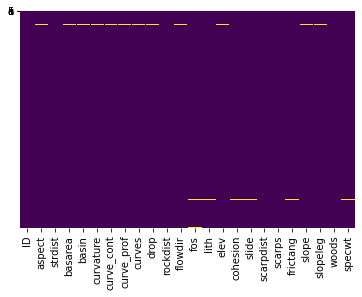

In [4]:
#Visualize all NaN data
sns.heatmap(df.isnull(),yticklabels='False',cbar=False,cmap='viridis')

In [5]:
#Delete A row that contain NaN in the column or variable of the dataset
df_clean = df.replace('MISSING', np.nan).dropna().reset_index(drop=True)
print('After Data Cleaning:', np.size(df))
df_clean.isnull().sum()

After Data Cleaning: 504240


ID            0
aspect        0
strdist       0
basarea       0
basin         0
curvature     0
curve_cont    0
curve_prof    0
curves        0
drop          0
rockdist      0
flowdir       0
fos           0
lith          0
elev          0
cohesion      0
slide         0
scarpdist     0
scarps        0
frictang      0
slope         0
slopeleg      0
woods         0
specwt        0
dtype: int64

<AxesSubplot:>

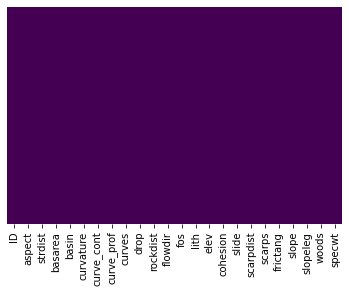

In [6]:
#Visualize all NaN data
sns.heatmap(df_clean.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [7]:
df_clean.describe()

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,elev,cohesion,slide,scarpdist,scarps,frictang,slope,slopeleg,woods,specwt
count,20661.000000,20661.000000,20661.000000,2.066100e+04,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,...,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000,20661.000000
mean,10478.636368,204.018024,80.665612,3.241700e+06,19.252166,0.006720,0.017645,0.024366,0.175299,28.572351,...,926.106519,18.162722,0.441847,58.774815,0.220028,23.093800,15.584957,549.720544,0.754126,21.522676
std,6036.305317,68.062884,91.099048,2.290549e+06,8.308838,1.449008,0.978573,0.706617,0.100408,20.892710,...,183.994899,14.504826,1.138633,65.399292,0.414275,10.117792,8.733018,252.707664,0.430615,1.940632
min,3.000000,0.005397,0.000000,1.200000e+03,1.000000,-10.811370,-12.574080,-7.542503,0.000497,1.666667,...,528.966400,10.000000,0.000000,0.000000,0.000000,17.000000,0.157048,44.721360,0.000000,19.000000
25%,5257.000000,169.836800,20.000000,3.892000e+05,17.000000,-0.667679,-0.389920,-0.282483,0.104197,15.000000,...,777.314200,10.000000,0.000000,20.000000,0.000000,17.000000,9.456009,389.974900,1.000000,20.000000
50%,10469.000000,210.545800,56.568540,5.068000e+06,17.000000,0.019348,0.006627,0.031532,0.156651,25.000000,...,945.309800,10.000000,0.000000,40.000000,0.000000,17.000000,13.917670,503.590000,1.000000,20.000000
75%,15694.000000,242.509700,101.980400,5.068000e+06,18.000000,0.658142,0.406648,0.328313,0.224142,36.666670,...,1071.669000,20.000000,1.000000,84.852810,0.000000,25.000000,19.845680,650.034200,1.000000,23.000000
max,20998.000000,359.918700,647.765400,5.068000e+06,51.000000,29.113010,10.524320,16.538930,0.736142,265.000000,...,1330.906000,50.000000,10.000000,382.099500,1.000000,45.000000,65.599170,2024.026000,1.000000,25.000000


In [8]:
df_clean.head(10)

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,elev,cohesion,slide,scarpdist,scarps,frictang,slope,slopeleg,woods,specwt
0,3,265.2971,644.9806,65600.0,1.0,-2.156464,0.636057,-1.520407,0.214373,25.0,...,1057.005,10.0,1.0,28.28427,0.0,23.0,15.346500,2024.026,1.0,19.0
1,4,267.3936,647.7654,65600.0,1.0,2.616730,-2.301352,0.315377,0.135763,40.0,...,1065.420,10.0,1.0,20.00000,0.0,23.0,12.929210,2015.106,1.0,19.0
2,7,272.0991,625.1400,65600.0,1.0,0.029022,-0.073801,-0.044779,0.164955,25.0,...,1058.138,10.0,1.0,20.00000,0.0,23.0,16.343020,1985.669,1.0,19.0
3,8,272.9689,628.0128,65600.0,1.0,-1.793457,0.881960,-0.911497,0.215654,25.0,...,1063.369,10.0,1.0,20.00000,0.0,23.0,16.766640,1976.543,1.0,19.0
4,9,261.2346,631.5062,65600.0,1.0,2.723572,-2.240553,0.483019,0.142164,42.5,...,1072.220,10.0,1.0,20.00000,0.0,23.0,13.314640,1968.201,1.0,19.0
5,12,287.9410,602.9926,65600.0,1.0,0.380432,-0.176626,0.203806,0.201194,37.5,...,1054.888,10.0,0.0,0.00000,1.0,23.0,17.375300,1957.517,1.0,19.0
6,13,298.5974,605.3098,65600.0,1.0,-1.952148,1.037233,-0.914915,0.198204,20.0,...,1059.088,10.0,0.0,0.00000,1.0,23.0,17.050100,1947.396,1.0,19.0
7,14,291.1888,608.2762,65600.0,1.0,-1.282166,0.188655,-1.093511,0.214908,27.5,...,1064.872,10.0,0.0,0.00000,1.0,23.0,17.745330,1938.055,1.0,19.0
8,15,290.8967,611.8823,65600.0,1.0,-2.048645,0.311583,-1.737062,0.179461,25.0,...,1070.177,10.0,0.0,0.00000,1.0,23.0,14.224400,1929.510,1.0,19.0
9,16,294.2935,616.1169,65600.0,1.0,0.494263,-0.443940,0.050323,0.106264,27.5,...,1075.828,10.0,1.0,0.00000,1.0,23.0,8.867694,1921.777,1.0,19.0


# ASPECT
The goal of this particular step is to separate two areas of slope. In simple, the data of **Aspect** are degrees, and we want to transform it into radians in the sense of cosine. In the end, we code it as a binary value of **1 (North)** and **0 (South)** 

The Flow of Processing:
<ol>
    <li>Change the <b>Degree</b> into <b>Radian</b> in a sense of Cosinus.</li>
    <li>Assign Value <b>1</b> for [Cosine (Radian) > 0] , and <b>0</b> for [Cosine (Radian) < 0].</li>
    <li>Updated Value for data of Aspect.</li>
</ol>

In [9]:
#Adjust the Aspect
for i in range(len(df_clean)):
    df_clean['aspect'][i] = np.cos((df_clean['aspect'][i]*np.pi)/180)
    if df_clean['aspect'][i] > 0:
        df_clean['aspect'][i] = 1
    else:
        df_clean['aspect'][i] = 0

df_clean.head(10)

<ipython-input-9-f9f1c24589c5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['aspect'][i] = np.cos((df_clean['aspect'][i]*np.pi)/180)
<ipython-input-9-f9f1c24589c5>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['aspect'][i] = 0
<ipython-input-9-f9f1c24589c5>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['aspect'][i] = 1


,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,elev,cohesion,slide,scarpdist,scarps,frictang,slope,slopeleg,woods,specwt
0,3,0.0,644.9806,65600.0,1.0,-2.156464,0.636057,-1.520407,0.214373,25.0,...,1057.005,10.0,1.0,28.28427,0.0,23.0,15.346500,2024.026,1.0,19.0
1,4,0.0,647.7654,65600.0,1.0,2.616730,-2.301352,0.315377,0.135763,40.0,...,1065.420,10.0,1.0,20.00000,0.0,23.0,12.929210,2015.106,1.0,19.0
2,7,1.0,625.1400,65600.0,1.0,0.029022,-0.073801,-0.044779,0.164955,25.0,...,1058.138,10.0,1.0,20.00000,0.0,23.0,16.343020,1985.669,1.0,19.0
3,8,1.0,628.0128,65600.0,1.0,-1.793457,0.881960,-0.911497,0.215654,25.0,...,1063.369,10.0,1.0,20.00000,0.0,23.0,16.766640,1976.543,1.0,19.0
4,9,0.0,631.5062,65600.0,1.0,2.723572,-2.240553,0.483019,0.142164,42.5,...,1072.220,10.0,1.0,20.00000,0.0,23.0,13.314640,1968.201,1.0,19.0
5,12,1.0,602.9926,65600.0,1.0,0.380432,-0.176626,0.203806,0.201194,37.5,...,1054.888,10.0,0.0,0.00000,1.0,23.0,17.375300,1957.517,1.0,19.0
6,13,1.0,605.3098,65600.0,1.0,-1.952148,1.037233,-0.914915,0.198204,20.0,...,1059.088,10.0,0.0,0.00000,1.0,23.0,17.050100,1947.396,1.0,19.0
7,14,1.0,608.2762,65600.0,1.0,-1.282166,0.188655,-1.093511,0.214908,27.5,...,1064.872,10.0,0.0,0.00000,1.0,23.0,17.745330,1938.055,1.0,19.0
8,15,1.0,611.8823,65600.0,1.0,-2.048645,0.311583,-1.737062,0.179461,25.0,...,1070.177,10.0,0.0,0.00000,1.0,23.0,14.224400,1929.510,1.0,19.0
9,16,1.0,616.1169,65600.0,1.0,0.494263,-0.443940,0.050323,0.106264,27.5,...,1075.828,10.0,1.0,0.00000,1.0,23.0,8.867694,1921.777,1.0,19.0


# FOS CLASSIFICATION
We have a feature called **Factor of Safety (FoS)**, which tells us about the slope's resisting forces to the driving forces. In order to get more knowledge about the data, especially for the Machine Learning model later, we **binned** such features into five classes. We consider the **binned FoS and unbinned FoS as the features in our Data Frame.**

The Flow of Processing:
<ol>
    <li>We binned the FoS data into 5 classes using Quantile Method.</li>
    <li>Convert all the result of binning into Binary Value (0,1).</li>
    <li>Updated Data Frame with additional of Binary Value for all binned FoS, and Unbinned FoS.</li>
</ol>

In [10]:
#Creating a label for fos classification 
class_fos_5 = []
for i in np.arange(5):
    class_fos_5.append('fos_'+str(i+1))

In [11]:
#Creating a Column for Binning Result using quantile
df_clean['fos_5th_class'] = pd.qcut(df_clean['fos'], q=5, labels=class_fos_5)
df_clean[['fos','fos_5th_class']]

,fos,fos_5th_class
0,1.318290,fos_3
1,1.094124,fos_2
2,1.029149,fos_2
3,1.048767,fos_2
4,1.007705,fos_2
...,...,...
20656,4.778810,fos_5
20657,4.338595,fos_5
20658,8.775199,fos_5
20659,5.946122,fos_5


Text(0.5, 1.0, 'FoS Binning')

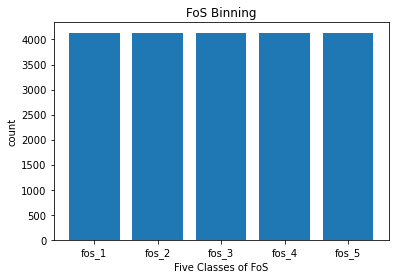

In [12]:
#Creating a Bar Chart after Quantile Binning
plt.bar(class_fos_5, df_clean["fos_5th_class"].value_counts())

# set x/y labels and plot title
plt.xlabel("Five Classes of FoS")
plt.ylabel("count")
plt.title("FoS Binning")

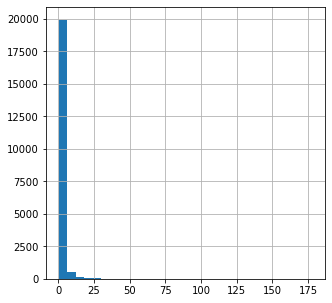

In [13]:
df_clean['fos'].hist(bins = 30, figsize = (5,5));

In [14]:
#FOS SEPARATION
fos = pd.get_dummies(df_clean["fos_5th_class"])
fos.columns = ['fos_1','fos_2','fos_3','fos_4','fos_5']
df_clean.drop(['fos_5th_class'],axis=1,inplace=True)
df_clean = pd.concat([df_clean,fos],axis=1)

df_clean.head()

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,frictang,slope,slopeleg,woods,specwt,fos_1,fos_2,fos_3,fos_4,fos_5
0,3,0.0,644.9806,65600.0,1.0,-2.156464,0.636057,-1.520407,0.214373,25.0,...,23.0,15.34650,2024.026,1.0,19.0,0,0,1,0,0
1,4,0.0,647.7654,65600.0,1.0,2.616730,-2.301352,0.315377,0.135763,40.0,...,23.0,12.92921,2015.106,1.0,19.0,0,1,0,0,0
2,7,1.0,625.1400,65600.0,1.0,0.029022,-0.073801,-0.044779,0.164955,25.0,...,23.0,16.34302,1985.669,1.0,19.0,0,1,0,0,0
3,8,1.0,628.0128,65600.0,1.0,-1.793457,0.881960,-0.911497,0.215654,25.0,...,23.0,16.76664,1976.543,1.0,19.0,0,1,0,0,0
4,9,0.0,631.5062,65600.0,1.0,2.723572,-2.240553,0.483019,0.142164,42.5,...,23.0,13.31464,1968.201,1.0,19.0,0,1,0,0,0


# PEARSON CORRELATION
Our goal is to make a model of Machine Learning for Lanslide Prediction. So it is evident that we should inspect first the relationship among our feature to get some insight for further analysis. Here we use the **Pearson Correlation** method which tell us about the linear relationship between two features, and have **value between -1 and 1**, where:
<ul>
    <li><b>1</b>: Maximum Positive linear correlation.</li>
    <li><b>0</b>: No linear correlation.</li>
    <li><b>-1</b>: Maximum negative linear correlation.</li>
</ul>

In [15]:
#Conduct the Pearson Correlation among all data 
df_clean.corr()

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,frictang,slope,slopeleg,woods,specwt,fos_1,fos_2,fos_3,fos_4,fos_5
ID,1.000000,-0.079310,-0.272694,0.023790,0.609095,-0.003402,0.004278,-0.001053,-0.068717,-0.080363,...,-0.150033,-0.065972,-0.384300,-0.343041,0.127877,-0.030023,0.009429,0.046443,-0.005498,-0.020348
aspect,-0.079310,1.000000,0.223450,-0.154948,-0.210646,0.061417,-0.029910,0.084522,0.110930,0.125461,...,0.299630,0.103262,0.252715,0.089356,0.260639,-0.025313,-0.109073,-0.047565,0.034143,0.147810
strdist,-0.272694,0.223450,1.000000,-0.329061,-0.212459,0.065377,-0.039328,0.079600,0.229213,0.239053,...,0.404875,0.228554,0.544593,0.025883,0.332172,0.000268,-0.114403,-0.071766,0.054039,0.131863
basarea,0.023790,-0.154948,-0.329061,1.000000,-0.351456,-0.009509,-0.007562,-0.029972,-0.164315,-0.141436,...,-0.337811,-0.165685,-0.454538,0.102972,-0.427345,0.097508,0.053882,0.018382,-0.058718,-0.111064
basin,0.609095,-0.210646,-0.212459,-0.351456,1.000000,0.009702,-0.003434,0.015139,-0.063599,-0.067074,...,-0.088218,-0.064694,-0.210304,-0.288300,0.144928,-0.086386,0.030468,0.057862,0.009249,-0.011184
curvature,-0.003402,0.061417,0.065377,-0.009509,0.009702,1.000000,-0.901972,0.801512,0.032381,0.448305,...,0.119285,-0.000166,0.006211,-0.006398,0.120472,0.001586,-0.018582,0.019701,-0.008580,0.005876
curve_cont,0.004278,-0.029910,-0.039328,-0.007562,-0.003434,-0.901972,1.000000,-0.464738,0.019641,-0.429765,...,-0.093502,0.057849,0.005369,0.000873,-0.097177,-0.004604,0.007924,-0.015392,0.010508,0.001564
curve_prof,-0.001053,0.084522,0.079600,-0.029972,0.015139,0.801512,-0.464738,1.000000,0.093601,0.324136,...,0.115122,0.079773,0.020172,-0.011910,0.112465,-0.003123,-0.027132,0.019083,-0.003041,0.014214
curves,-0.068717,0.110930,0.229213,-0.164315,-0.063599,0.032381,0.019641,0.093601,1.000000,0.852592,...,0.305074,0.978702,0.240679,0.216321,0.205833,0.350142,0.005025,-0.057937,-0.055028,-0.242234
drop,-0.080363,0.125461,0.239053,-0.141436,-0.067074,0.448305,-0.429765,0.324136,0.852592,1.000000,...,0.337714,0.832116,0.218044,0.183375,0.240776,0.304160,-0.020378,-0.037367,-0.047015,-0.199426


In [16]:
#Delete Column of Rockdist as the data apparently can not be further processed
df_clean = df_clean.drop('rockdist', axis=1)
df_clean.corr()

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,frictang,slope,slopeleg,woods,specwt,fos_1,fos_2,fos_3,fos_4,fos_5
ID,1.000000,-0.079310,-0.272694,0.023790,0.609095,-0.003402,0.004278,-0.001053,-0.068717,-0.080363,...,-0.150033,-0.065972,-0.384300,-0.343041,0.127877,-0.030023,0.009429,0.046443,-0.005498,-0.020348
aspect,-0.079310,1.000000,0.223450,-0.154948,-0.210646,0.061417,-0.029910,0.084522,0.110930,0.125461,...,0.299630,0.103262,0.252715,0.089356,0.260639,-0.025313,-0.109073,-0.047565,0.034143,0.147810
strdist,-0.272694,0.223450,1.000000,-0.329061,-0.212459,0.065377,-0.039328,0.079600,0.229213,0.239053,...,0.404875,0.228554,0.544593,0.025883,0.332172,0.000268,-0.114403,-0.071766,0.054039,0.131863
basarea,0.023790,-0.154948,-0.329061,1.000000,-0.351456,-0.009509,-0.007562,-0.029972,-0.164315,-0.141436,...,-0.337811,-0.165685,-0.454538,0.102972,-0.427345,0.097508,0.053882,0.018382,-0.058718,-0.111064
basin,0.609095,-0.210646,-0.212459,-0.351456,1.000000,0.009702,-0.003434,0.015139,-0.063599,-0.067074,...,-0.088218,-0.064694,-0.210304,-0.288300,0.144928,-0.086386,0.030468,0.057862,0.009249,-0.011184
curvature,-0.003402,0.061417,0.065377,-0.009509,0.009702,1.000000,-0.901972,0.801512,0.032381,0.448305,...,0.119285,-0.000166,0.006211,-0.006398,0.120472,0.001586,-0.018582,0.019701,-0.008580,0.005876
curve_cont,0.004278,-0.029910,-0.039328,-0.007562,-0.003434,-0.901972,1.000000,-0.464738,0.019641,-0.429765,...,-0.093502,0.057849,0.005369,0.000873,-0.097177,-0.004604,0.007924,-0.015392,0.010508,0.001564
curve_prof,-0.001053,0.084522,0.079600,-0.029972,0.015139,0.801512,-0.464738,1.000000,0.093601,0.324136,...,0.115122,0.079773,0.020172,-0.011910,0.112465,-0.003123,-0.027132,0.019083,-0.003041,0.014214
curves,-0.068717,0.110930,0.229213,-0.164315,-0.063599,0.032381,0.019641,0.093601,1.000000,0.852592,...,0.305074,0.978702,0.240679,0.216321,0.205833,0.350142,0.005025,-0.057937,-0.055028,-0.242234
drop,-0.080363,0.125461,0.239053,-0.141436,-0.067074,0.448305,-0.429765,0.324136,0.852592,1.000000,...,0.337714,0.832116,0.218044,0.183375,0.240776,0.304160,-0.020378,-0.037367,-0.047015,-0.199426


# LITHOLOGY SEPARATION
We want to take into account the feature of **Lithology** for later Machine Learning Model. So, we transform such features into 7 different features that tell us about its specific Lithology, in the sense of **Binary Value (0 & 1)**.

The Flow of Processing:
<ol>
    <li>We create new features for each of all Lithology, and assign them as Binary Value types.</li>
    <li>We delete the feature of <b>Lithology</b>, and only consider the <b>classified lithology features</b>.</li>
    <li>Updated Data Frame with additional of Binary Value for all type of lithology.</li>
</ol>

In [17]:
#LITHOLOGY SEPARATION
litho = pd.get_dummies(df_clean["lith"])
litho.columns = ['Limestone', 'Marl', 'Evaporties', 'Rockfall debris', 'Moraine on Marls', 'Moraine Thick', 'Moraine on Evaporites']
df_clean.drop(['lith'],axis=1,inplace=True)
df_clean = pd.concat([df_clean,litho],axis=1)

df_clean.head()

,ID,aspect,strdist,basarea,basin,curvature,curve_cont,curve_prof,curves,drop,...,fos_3,fos_4,fos_5,Limestone,Marl,Evaporties,Rockfall debris,Moraine on Marls,Moraine Thick,Moraine on Evaporites
0,3,0.0,644.9806,65600.0,1.0,-2.156464,0.636057,-1.520407,0.214373,25.0,...,1,0,0,0,0,1,0,0,0,0
1,4,0.0,647.7654,65600.0,1.0,2.616730,-2.301352,0.315377,0.135763,40.0,...,0,0,0,0,0,1,0,0,0,0
2,7,1.0,625.1400,65600.0,1.0,0.029022,-0.073801,-0.044779,0.164955,25.0,...,0,0,0,0,0,1,0,0,0,0
3,8,1.0,628.0128,65600.0,1.0,-1.793457,0.881960,-0.911497,0.215654,25.0,...,0,0,0,0,0,1,0,0,0,0
4,9,0.0,631.5062,65600.0,1.0,2.723572,-2.240553,0.483019,0.142164,42.5,...,0,0,0,0,0,1,0,0,0,0


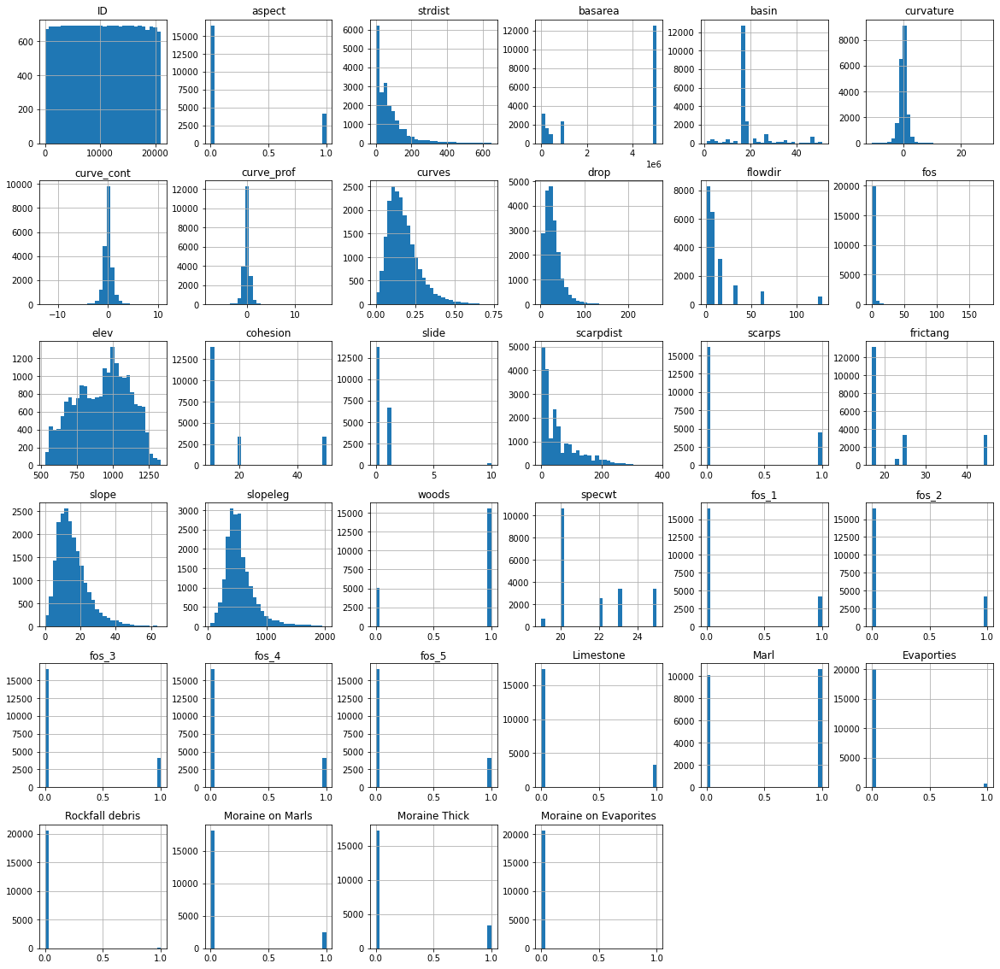

In [18]:
#Histogram of the Data
df_clean.hist(bins = 30, figsize = (20,20));

In [19]:
#Make a correction in Slide value
for i in range(len(df_clean)):
    if df_clean['slide'][i] > 1:
        df_clean['slide'][i] = 1

<ipython-input-19-c28066a9a2be>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['slide'][i] = 1


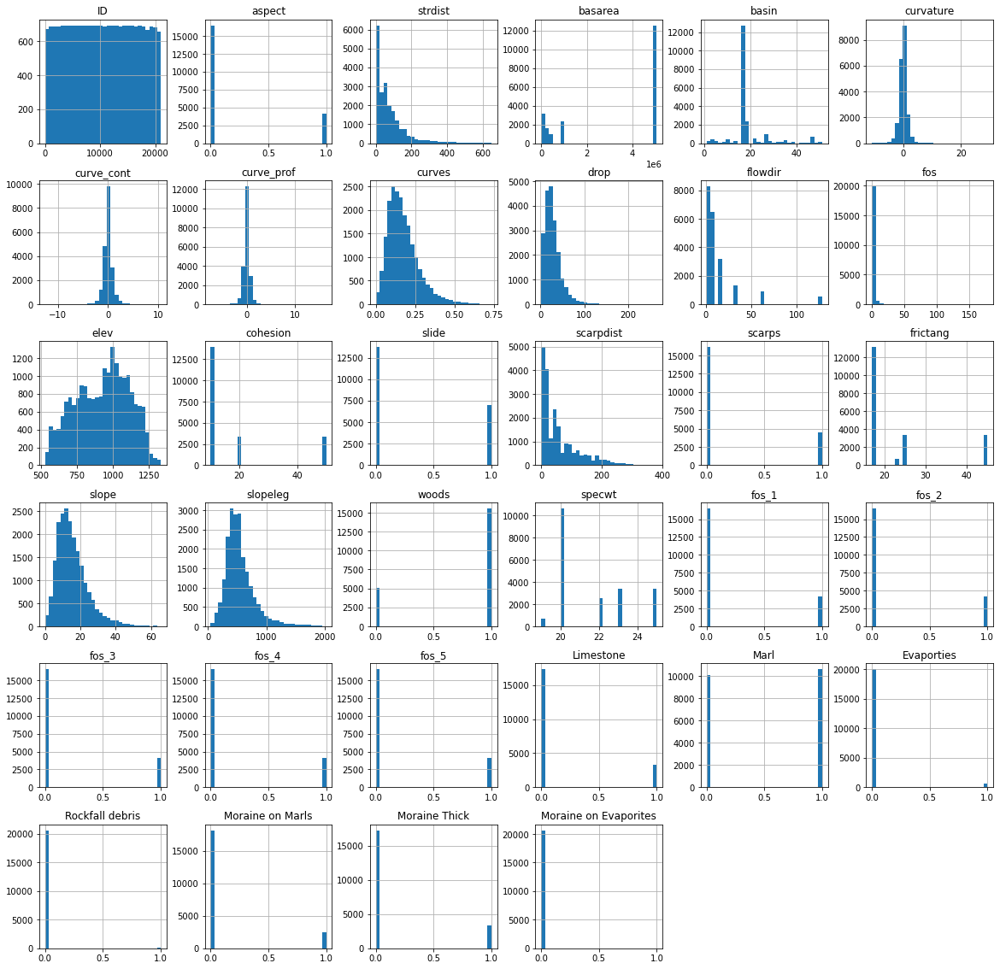

In [20]:
#Histogram of the Data after correction in SLide Value
df_clean.hist(bins = 30, figsize = (20,20));

In [21]:
##To check the data outliers in each feature
# def box_plots(feature):
#     plt.figure (figsize=(5,4))
#     df_clean[feature].plot(kind='box', color='blue', vert=False)

# for i in df_clean.columns:
#     box_plots(i)

# TRANSFORMING, NORMALIZING, and RE-SCALING
In this step, we do the data transformation into normal distribution data and data re-scaling. The data transformation could help a better result (model of prediction) when it is numerically in a normal distribution. The method to transform the data distribution, based on the Module in Scikit, are **Quantile Transform, Log, Yeo-Jhonson,** and **Box-Cox**, in which we can **decide it subjectively**. For the data re-scaling, we apply for data in each feature a range of either **(0 - 1)** or **((-1) - 1)**.

The Flow of Processing:
<ol>
    <li>We create a function to automatically plot the distribution of the data with all methods.</li>
    <li>We classify each feature manually into a particular method of transformation, or even for no transformation.</li>
    <li>Re-Scale the data by the range of <b>(0 - 1) if our data has a minimum above 0</b>, or <b>((-1) - 1) if our data has a minimum below 0</b>.</li>
     <li>New Data Frame after transformation and re-scaling all the features: <b>df_trans</b>.</li>
</ol>

In [22]:
#Function for Transformation Distribution Plot
def plots(df, var, t1, t2, t3, t4):
    plt.figure (figsize=(20,5))
    plt.subplot(151)
    sns.kdeplot(df[var])
    plt.title ('before')
    
    plt.subplot(152)
    p1 = t1.fit_transform(df[[var]]).flatten()
    sns.kdeplot(p1)
    plt.title('after ' +str(t1).split('(')[0])
    
    plt.subplot(153)
    p2 = t2(np.expm1((df[var]+abs(min(df[var])))/200))
    sns.kdeplot(p2)
    plt.title('after ' +str(t2).split('(')[0])
    
    if min(df[var])>0:
        
        plt.subplot(154)
        p3 = t3.fit_transform(df[[var]]).flatten()
        sns.kdeplot(p3)
        plt.title('after (yeo-Jhonson) ' +str(t3).split('(')[0])
    
        plt.subplot(155)
        p4 = t4.fit_transform(df[[var]]).flatten()
        sns.kdeplot(p4)
        plt.title('after (box-cox) ' +str(t4).split('(')[0])
        
    else:
        plt.subplot(154)
        p3 = t3.fit_transform(df[[var]]).flatten()
        sns.kdeplot(p3)
        plt.title('after (yeo-Jhonson) ' +str(t3).split('(')[0])
    

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: overflow encountered in expm1
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
<ipython-input-22-a0fd595a2de2>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure (figsize=(20,5))


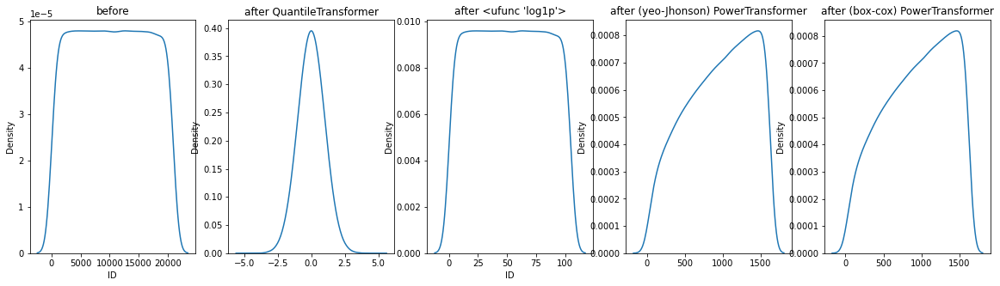

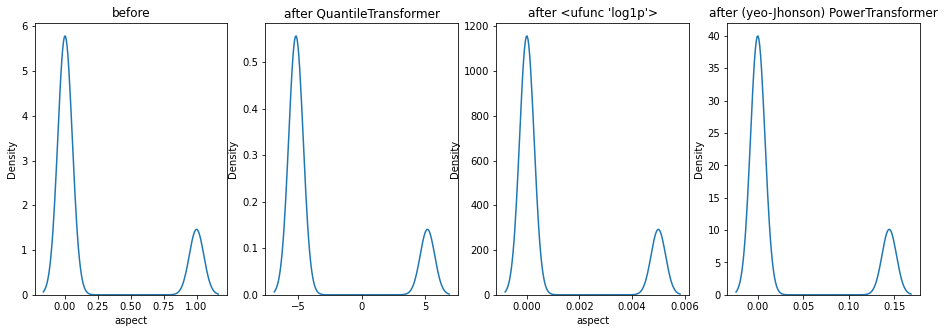

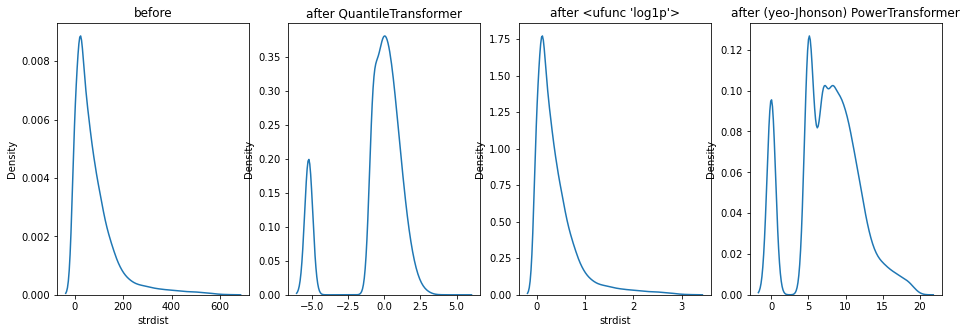

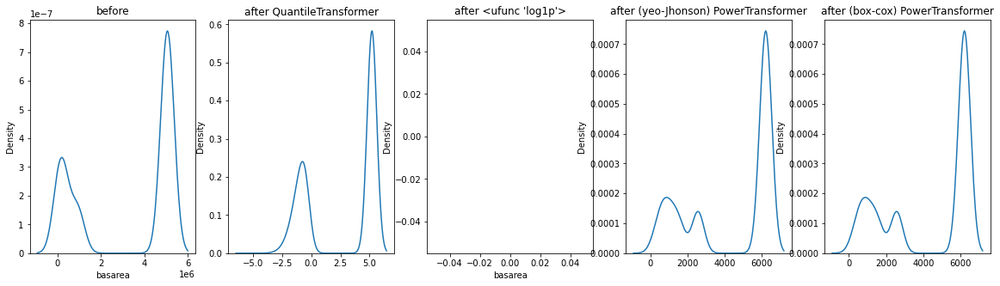

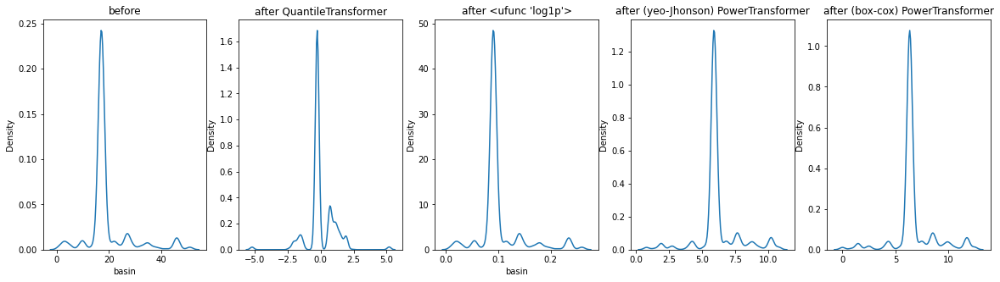

...

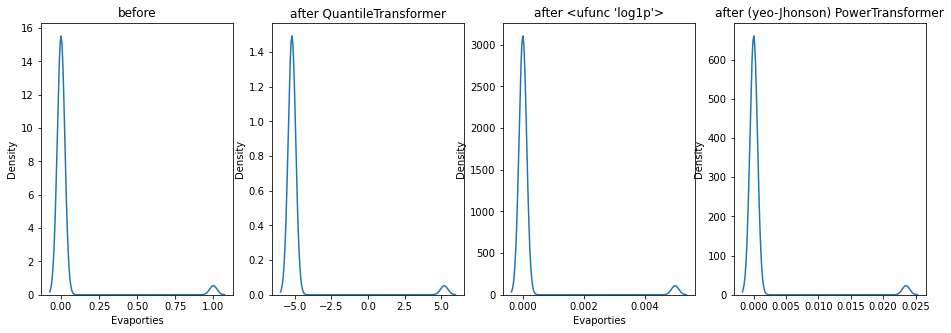

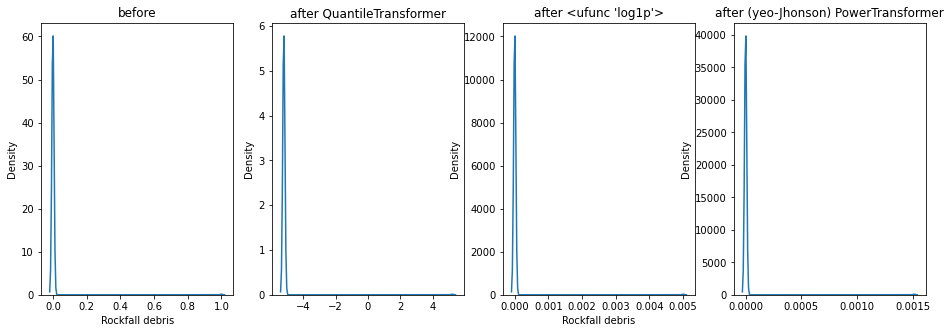

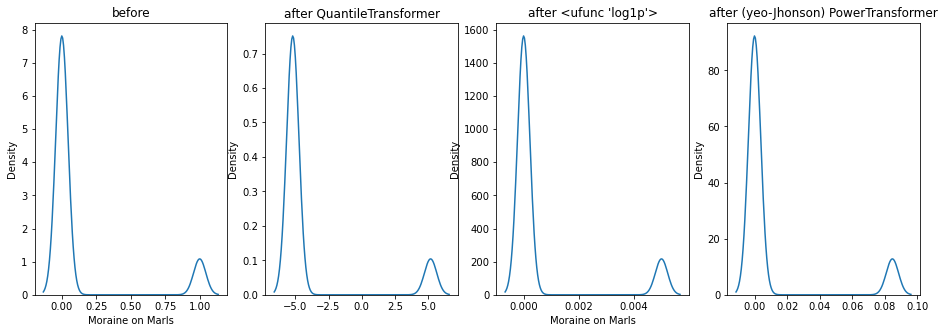

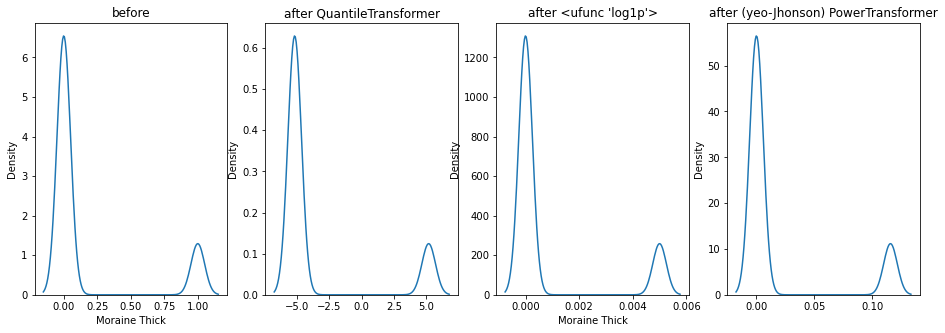

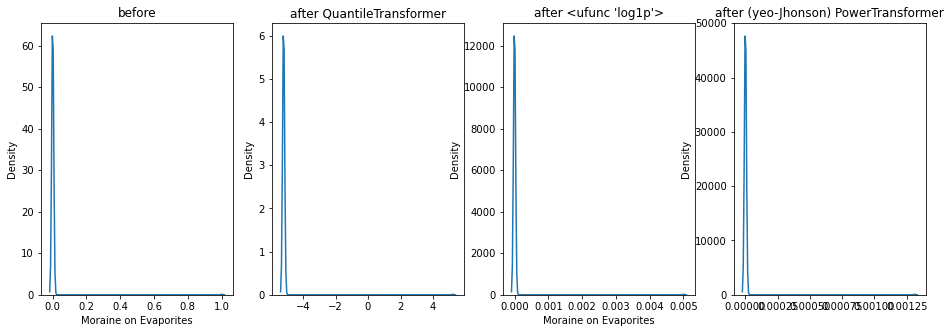

In [23]:
for col in df_clean.columns:
    plots(df_clean, col, QuantileTransformer(output_distribution='normal'), np.log1p, PowerTransformer(method='yeo-johnson', standardize=False), PowerTransformer(method='box-cox', standardize=False))

In [24]:
#Manual Selection for Transformation's Method
column_quantile=['curvature','curve_cont','curve_prof','fos']
column_log=['specwt']
column_yeojhon=['curves','slope']
column_boxcox=['drop','slopeleg']
column_untransform=['strdist','cohesion','scarpdist','elev','basarea','frictang']
column_unchanged=['ID','aspect','basin','flowdir','Limestone','Marl', 'Evaporties', 'Rockfall debris', 'Moraine on Marls', 'Moraine Thick', 'Moraine on Evaporites','slide','scarps','woods', 'fos_1','fos_2','fos_3','fos_4','fos_5']

In [25]:
#Data Normalization
df_trans = df_clean
for a in column_quantile:
    locals()['trans_'+a] = QuantileTransformer(output_distribution='normal').fit_transform(df_trans[[a]]).flatten()
    if min(locals()['trans_'+a]) >= 0: 
        locals()['trans_'+a] = MinMaxScaler().fit_transform(locals()['trans_'+a].reshape(-1,1))
    else:
        locals()['trans_'+a] = MaxAbsScaler().fit_transform(locals()['trans_'+a].reshape(-1,1))

for aa in column_log:
    locals()['trans_'+aa] = QuantileTransformer(output_distribution='normal').fit_transform(df_trans[[aa]]).flatten()
    if min(locals()['trans_'+aa]) >= 0: 
        locals()['trans_'+aa] = MinMaxScaler().fit_transform(locals()['trans_'+aa].reshape(-1,1))
    else:
        locals()['trans_'+aa] = MaxAbsScaler().fit_transform(locals()['trans_'+aa].reshape(-1,1))
        
for b in column_yeojhon:
    locals()['trans_'+b] = PowerTransformer(method='yeo-johnson', standardize=False).fit_transform(df_trans[[b]]).flatten()
    if min(locals()['trans_'+b]) >= 0: 
        locals()['trans_'+b] = MinMaxScaler().fit_transform(locals()['trans_'+b].reshape(-1,1))
    else:
        locals()['trans_'+b] = MaxAbsScaler().fit_transform(locals()['trans_'+b].reshape(-1,1))
        
for c in column_boxcox:
    locals()['trans_'+c] = PowerTransformer(method='box-cox', standardize=False).fit_transform(df_trans[[c]]).flatten()
    if min(locals()['trans_'+a]) >= 0: 
        locals()['trans_'+c] = MinMaxScaler().fit_transform(locals()['trans_'+c].reshape(-1,1))
    else:
        locals()['trans_'+c] = MaxAbsScaler().fit_transform(locals()['trans_'+c].reshape(-1,1))

for d in column_untransform:
    locals()['trans_'+d] = df_trans[d].values
    if min(locals()['trans_'+d]) >= 0: 
        locals()['trans_'+d] = MinMaxScaler().fit_transform(locals()['trans_'+d].reshape(-1,1))
    else:
        locals()['trans_'+d] = MaxAbsScaler().fit_transform(locals()['trans_'+d].reshape(-1,1))
        
for e in column_unchanged:
    locals()['trans_'+e] = df_trans[e].values

In [26]:
## Manual Code for Normalizing
# for i in df_trans.columns:
#     if min(df_trans[i]) > 0:
#         for m in range(len(df_trans[i])):
#             df_trans[i][m] = (df_trans[i][m] - min(df_trans[i]))/(max(df_trans[i]) - min(df_trans[i]))
#     else:
#         for n in range(len(df_trans[i])):
#             if df_trans[i][n] < 0:  
#                 df_trans[i][n] = (0 - df_trans[i][n]) / (0 - min(df_trans[i]))*(-1)
#             else:
#                 df_trans[i][n] = df_trans[i][n] / max(df_trans[i])

In [27]:
#Creating a list of Variable's name after transformation and normalization
comb_trans=[]
for i in df_trans.columns:
    comb_trans.append('trans_'+i)

In [28]:
#Creating Dataframe for Transformed and Normalized dataset
red = {}

for yy in comb_trans:
    red[yy] = locals()[yy].flatten().tolist()
    
df_trans = pd.DataFrame(red, columns=comb_trans)
df_trans

,trans_ID,trans_aspect,trans_strdist,trans_basarea,trans_basin,trans_curvature,trans_curve_cont,trans_curve_prof,trans_curves,trans_drop,...,trans_fos_3,trans_fos_4,trans_fos_5,trans_Limestone,trans_Marl,trans_Evaporties,trans_Rockfall debris,trans_Moraine on Marls,trans_Moraine Thick,trans_Moraine on Evaporites
0,3,0.0,0.995701,0.012710,1.0,-0.316252,0.183368,-0.398582,0.607534,0.426579,...,1,0,0,0,0,1,0,0,0,0
1,4,0.0,1.000000,0.012710,1.0,0.358936,-0.427890,0.125338,0.448494,0.518247,...,0,0,0,0,0,1,0,0,0,0
2,7,1.0,0.965072,0.012710,1.0,0.002329,-0.030437,-0.035495,0.513891,0.426579,...,0,0,0,0,0,1,0,0,0,0
3,8,1.0,0.969507,0.012710,1.0,-0.279417,0.232742,-0.293052,0.609713,0.426579,...,0,0,0,0,0,1,0,0,0,0
4,9,0.0,0.974900,0.012710,1.0,0.367978,-0.421872,0.181166,0.463558,0.530779,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20656,20993,1.0,0.069039,0.059209,46.0,-0.083979,0.075787,-0.089233,0.348526,0.317930,...,0,0,1,0,0,0,0,0,1,0
20657,20994,1.0,0.043664,0.059209,46.0,0.051130,-0.069418,0.014982,0.192720,0.273016,...,0,0,1,0,0,0,0,0,1,0
20658,20995,1.0,0.030875,0.059209,46.0,0.148598,-0.207607,0.004555,0.184993,0.307604,...,0,0,1,0,0,0,0,0,1,0
20659,20997,1.0,0.030875,0.059209,46.0,0.267563,-0.278413,0.204172,0.511799,0.461014,...,0,0,1,0,0,0,0,0,1,0


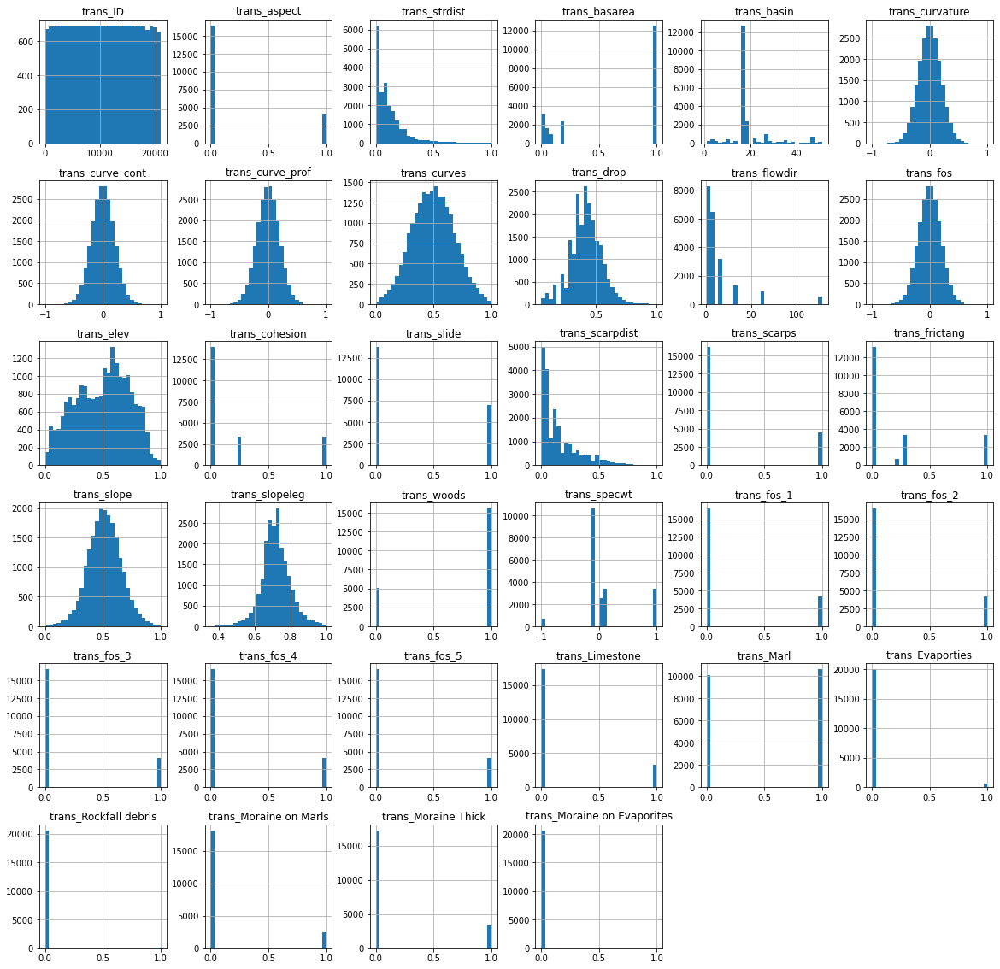

In [29]:
df_trans.hist(bins = 30, figsize = (20,20));

# 2nd PEARSON CORRELATION CHECK

<AxesSubplot:>

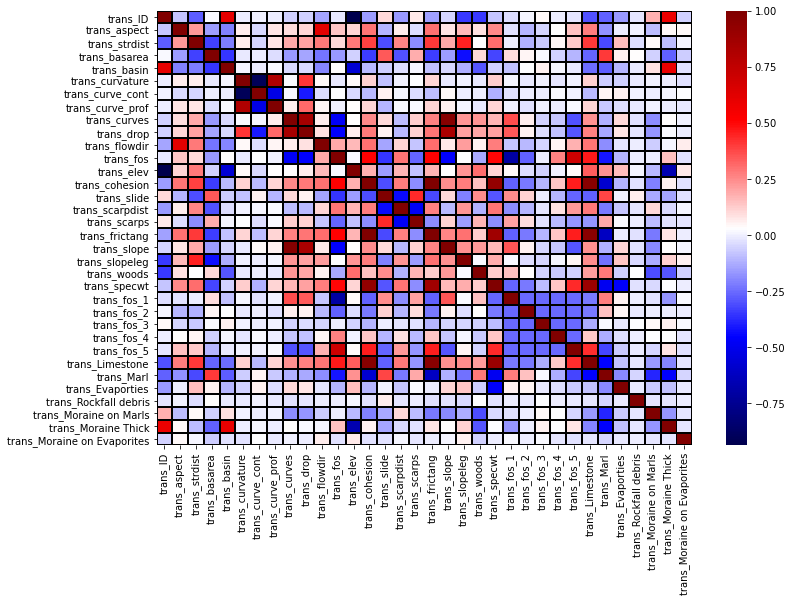

In [30]:
#Plot Heat Map
plt.figure(figsize=(12,8))
sns.heatmap(df_trans.corr(), linecolor='black', linewidths=1, cmap='seismic')

<AxesSubplot:>

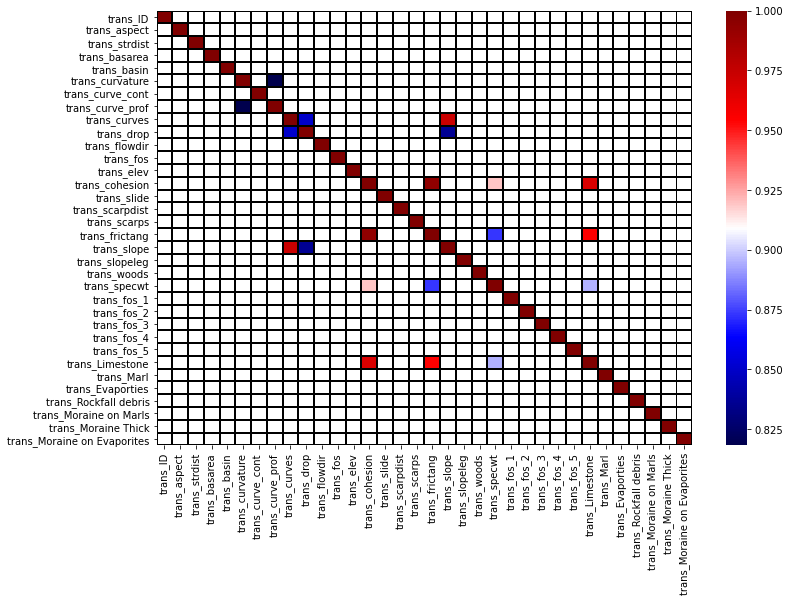

In [31]:
#Specific check to the all Correlation values above 0.8
#Data Frame Preparation
corr = df_trans.corr()
cond_corr = corr[corr>0.8]

#Plot Heat Map
plt.figure(figsize=(12,8))
sns.heatmap(cond_corr, linecolor='black', linewidths=1, cmap='seismic')

In [32]:
#List All Correlation values above 0.8
cond_corr_sort = cond_corr
cond_corr_sort.replace(1, np.nan, inplace=True)
df_high_corr = cond_corr_sort.abs().unstack().drop_duplicates(keep='first').sort_values(ascending=False).to_frame(name='Correlation Value')
df_high_corr

,,Correlation Value
trans_cohesion,trans_frictang,0.993630
trans_curves,trans_slope,0.973462
trans_cohesion,trans_Limestone,0.968003
trans_frictang,trans_Limestone,0.954848
trans_cohesion,trans_specwt,0.919382
trans_specwt,trans_Limestone,0.895460
trans_frictang,trans_specwt,0.873362
trans_curves,trans_drop,0.850262
trans_drop,trans_slope,0.835961
trans_curvature,trans_curve_prof,0.818191


## Logistic Regression Model
Logistic regression is a robust and flexible method for dichotomous (binary) classification prediction; that is, it is used to predict for a binary outcome or state (Seufert, 2014). The logistic regression use a **Logistic Function** to create a model for binary data, in which have a Sigmoid Curve function.

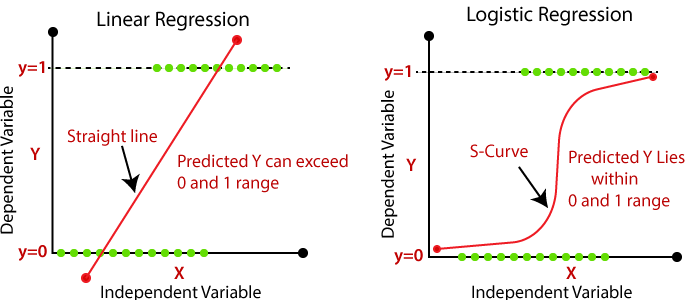
___
<center> <b>Linear Regression Function vs Logistic Regression Function (Jauregui, 2021)</b> <center>

In [33]:
#Pearson Correlation of all features with Landslide Feature
df_trans[df_trans.columns[1:]].corr()['trans_slide'][:].abs().sort_values(ascending=False)

trans_slide                    1.000000
trans_scarps                   0.438180
trans_scarpdist                0.436005
trans_Marl                     0.381935
trans_fos                      0.353007
trans_basarea                  0.345430
trans_frictang                 0.312783
trans_strdist                  0.307812
trans_cohesion                 0.306148
trans_specwt                   0.290632
trans_Limestone                0.265225
trans_fos_5                    0.257791
trans_woods                    0.248347
trans_fos_1                    0.245940
trans_slopeleg                 0.203543
trans_elev                     0.151708
trans_Moraine Thick            0.141085
trans_flowdir                  0.138374
trans_Moraine on Marls         0.131545
trans_fos_2                    0.121625
trans_fos_4                    0.108790
trans_curve_prof               0.106433
trans_slope                    0.105376
trans_aspect                   0.104973
trans_curves                   0.103519


In [34]:
#P_Value to see signifant correlation for Landslide Prediction
df_corr_slide = pd.DataFrame(columns = ['Variable with trans_slide', 'Pearson Value', 'P-Value'])

for i in comb_trans:
    pearson_coef, p_value = stats.pearsonr(df_trans[i], df_trans['trans_slide'])
    tem_df_corr = pd.DataFrame({'Variable with trans_slide': i, 'Pearson Value': [pearson_coef], 'P-Value': [p_value]})
    df_corr_slide = df_corr_slide.append(tem_df_corr, ignore_index = True) 

In [35]:
#Sorting The Pearson Value and P-Value for Landslide Prediction
df_corr_slide.sort_values('Pearson Value', ascending=False).reset_index()

,index,Variable with trans_slide,Pearson Value,P-Value
0,14,trans_slide,1.000000,0.000000e+00
1,16,trans_scarps,0.438180,0.000000e+00
2,28,trans_Marl,0.381935,0.000000e+00
3,3,trans_basarea,0.345430,0.000000e+00
4,20,trans_woods,0.248347,5.839894e-288
5,22,trans_fos_1,0.245940,2.850424e-282
6,23,trans_fos_2,0.121625,6.338112e-69
7,18,trans_slope,0.105376,4.242961e-52
8,0,trans_ID,0.105090,7.978452e-52
9,8,trans_curves,0.103519,2.479044e-50


In [36]:
#Assign Variables that will be used for 'ALL' Multivariate Model
upper = 0.3
lower = -0.3
var_for_multi=[]
for i in df_corr_slide['Variable with trans_slide']:
    if df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values > upper:
        var_for_multi.append(i)
    elif df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values < lower:
        var_for_multi.append(i)
    else:
        continue

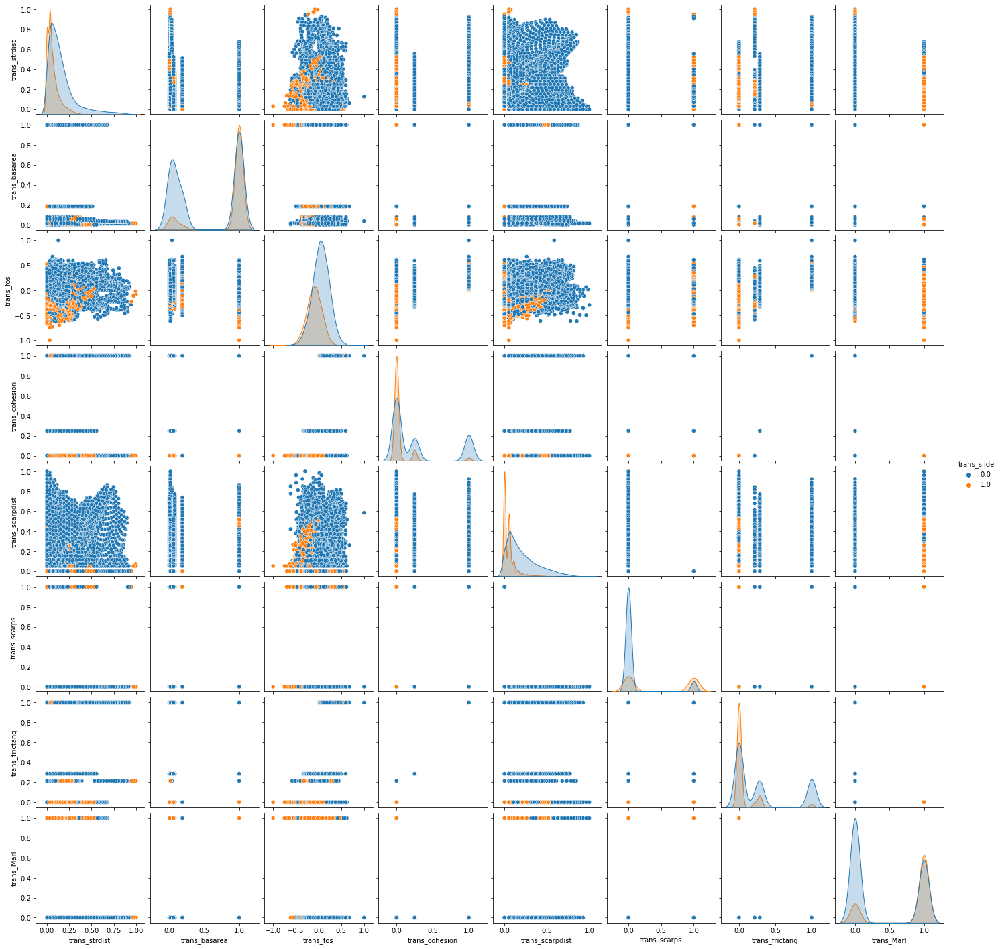

In [37]:
#Visualizing The Dataset crossplot between features with colormap of Lanslide
sns.pairplot(df_trans[var_for_multi],hue='trans_slide')

In [38]:
clean_var_for_multi = var_for_multi

#Data Train and Data Test for 'ALL' Multivariate Model
target = 'trans_slide'
clean_var_for_multi.remove(target)
rn = np.random.RandomState(0)
X_train, X_test, y_train, y_test = train_test_split(df_trans[clean_var_for_multi], df_trans['trans_slide'], test_size=0.40, random_state=rn)

print("number of test samples :", X_test.shape[0])
print("number of training samples:",X_train.shape[0])

number of test samples : 8265
number of training samples: 12396


In [39]:
#Logistic Regresion
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

predictions = logmodel.predict(X_test)

In [40]:
#Confusion Matrix for Logistic Regression
con_mat_pred_slide = confusion_matrix(y_test,predictions)

#Accuracy score for Logistic Regression
acc_sco_pred_slide = accuracy_score(y_test,predictions)

#Classification Report for Logistic Regression
clas_pred_slide = classification_report(y_test,predictions)

In [41]:
con_mat_pred_slide

array([[4789,  689],
       [ 832, 1955]], dtype=int64)

In [42]:
print('Score for Logistic Regression:', acc_sco_pred_slide)

Score for Logistic Regression: 0.8159709618874773


In [43]:
print(clas_pred_slide)

              precision    recall  f1-score   support

         0.0       0.85      0.87      0.86      5478
         1.0       0.74      0.70      0.72      2787

    accuracy                           0.82      8265
   macro avg       0.80      0.79      0.79      8265
weighted avg       0.81      0.82      0.81      8265



In [44]:
#Function for distribution of Training and Test Data comparison after the model being applied 
def ComparisonPlot(green, blue, Title):
    plt.figure(figsize=(8, 10))

    ax1 = sns.distplot(green, hist=False, color="g", label='Actual Value')
    ax2 = sns.distplot(blue, hist=False, color="b", label='Predicted Value', ax=ax1)

    plt.title(Title)
    plt.xlabel('Slide')
    plt.ylabel('All Factors')
    plt.legend()

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


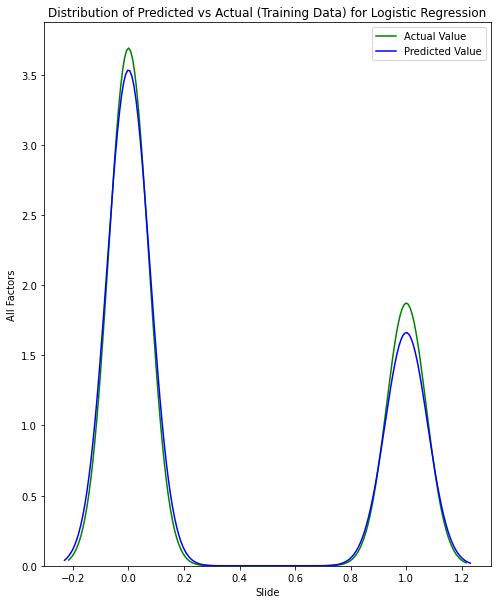

In [45]:
Title = 'Distribution of Predicted vs Actual (Training Data) for Logistic Regression'
ComparisonPlot(y_train, predictions, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


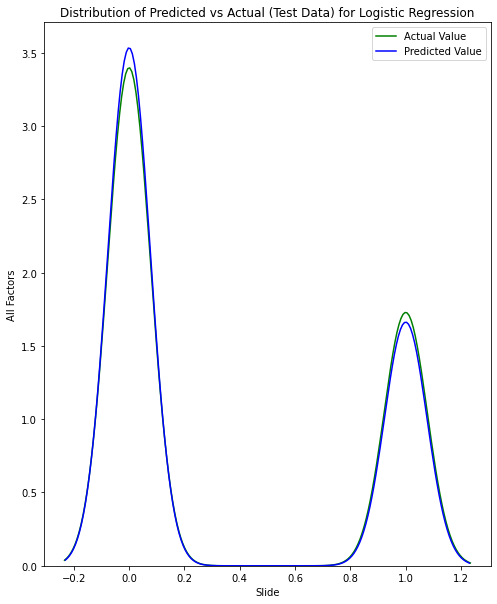

In [46]:
Title = 'Distribution of Predicted vs Actual (Test Data) for Logistic Regression'
ComparisonPlot(y_test, predictions, Title)

In [47]:
logmodel.intercept_

array([-0.75557199])

In [48]:
logmodel.coef_

array([[-6.28789468,  0.89756251, -2.95701794, -0.07111503, -6.73967531,
         0.91865756, -0.08880472,  0.73440145]])

## B. Decision Tree Model
Decision tree is a technique in supervised machine learning that consists of internal nodes which related to attributes, edges which related to subsets of attribute or feature values, and terminal nodes (leaves) which related to class labels (Kononenko and Kukar, 2007). In Decision Tree, we should follow the **Ideal Tree Algorithm** which, in simple, we have to select a correct attribute as a node for the Decision Tree Splits. In order to get the correct attribute for a node, we could use the **Entropy** or **Gini Impurity** to measure the purity of split. We do the Decision Tree Splits by minimalize the total Entropy or Gini Impurity Value.

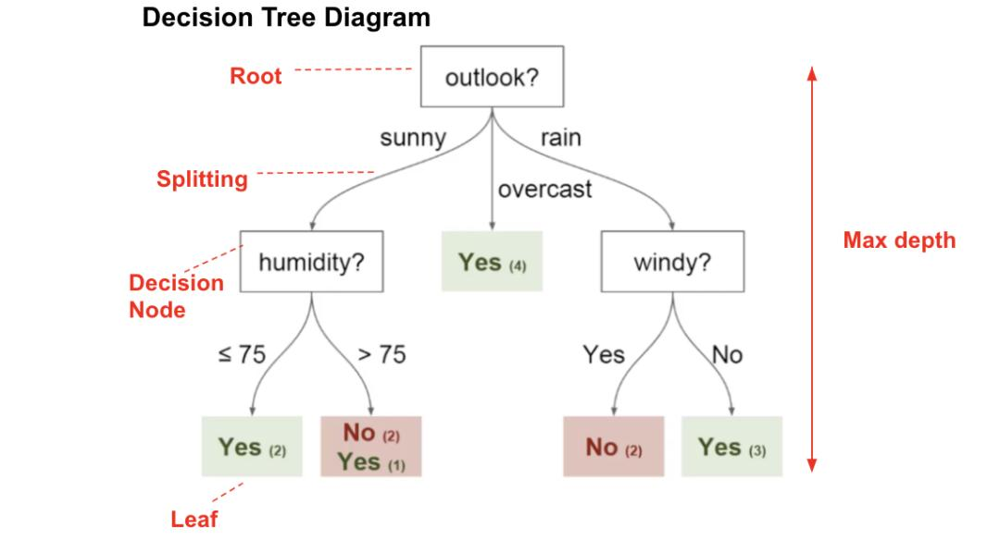
___
<center> <b>Decision Tree Model Visualization (programmersought.com, 2021)</b> <center>

In [49]:
#Creating Dictionary for searching the best parameter
param_max_depth= [{'max_depth': [1,3,5,10,20,50,70]}]
clf = tree.DecisionTreeClassifier(criterion = 'entropy')

In [50]:
#Deploy Decision Tree with the best parameter of Maximum Depth
Grid_tree = GridSearchCV(clf, param_max_depth, cv=4)
best_param_tree = Grid_tree.fit(X_train,y_train).best_estimator_
predictions_clf = best_param_tree.predict(X_test)

print('Best Parameter:', Grid_tree.best_params_)

Best Parameter: {'max_depth': 10}


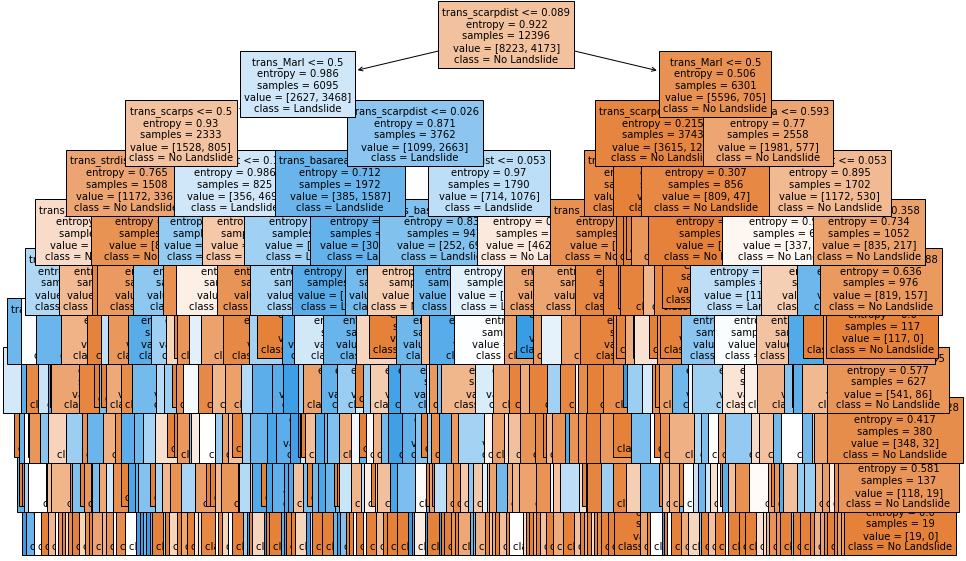

In [51]:
#Decision Tree Result Visualization
plt.figure(figsize = (15,10))
dd = ['No Landslide', 'Landslide']
slider = np.array(dd)

tree.plot_tree(best_param_tree, class_names = slider, feature_names = np.array(clean_var_for_multi), filled = True, fontsize = 10);

In [52]:
#Confusion Matrix for Decision Tree
con_mat_pred_slide_tree = confusion_matrix(y_test,predictions_clf)

#Accuracy score for Decision Tree
acc_sco_pred_slide_tree = accuracy_score(y_test,predictions_clf)

#Classification Report for Decision Tree
clas_pred_slide_tree = classification_report(y_test,predictions_clf)

In [53]:
print(con_mat_pred_slide_tree)

[[4720  758]
 [ 632 2155]]


In [54]:
print('Score for Decision Tree:',acc_sco_pred_slide_tree)

Score for Decision Tree: 0.8318209316394435


In [55]:
print(clas_pred_slide_tree)

              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87      5478
         1.0       0.74      0.77      0.76      2787

    accuracy                           0.83      8265
   macro avg       0.81      0.82      0.81      8265
weighted avg       0.83      0.83      0.83      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


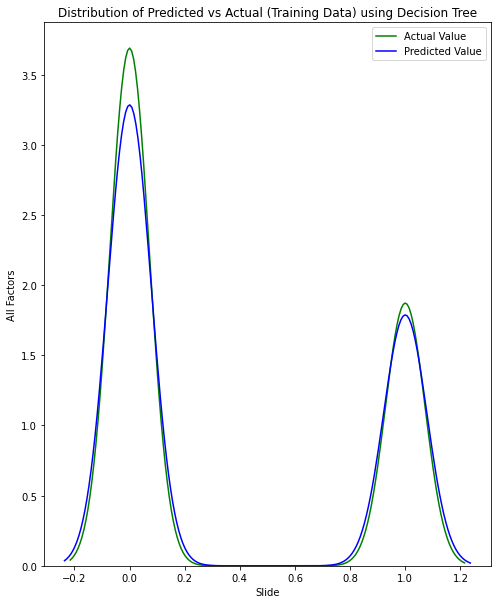

In [56]:
Title = 'Distribution of Predicted vs Actual (Training Data) using Decision Tree'
ComparisonPlot(y_train, predictions_clf, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


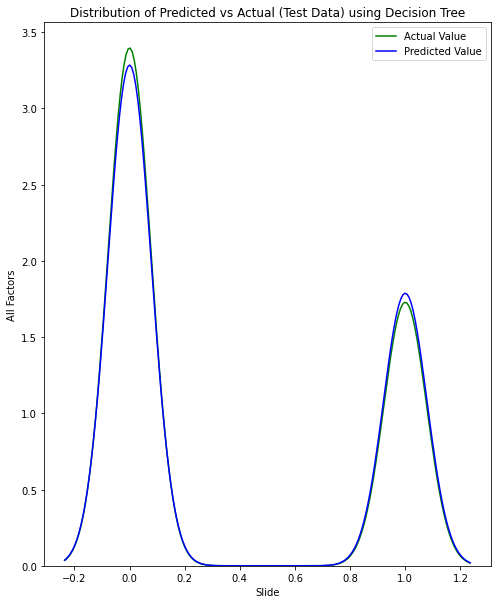

In [57]:
Title = 'Distribution of Predicted vs Actual (Test Data) using Decision Tree'
ComparisonPlot(y_test, predictions_clf, Title)

## C. Support Vector Machine (SVM) Model
**Support vector machines (SVM)** is a supervised machine learning method to analyze data and recognize patterns in which performs classification by creating an **N-dimensional hyperplane (a plane generalized into N dimensions)** that can optimally separate the data into two categories (Farber, 2012). However, the hyperplane could only give us a good result (maximize the Margin result) for a **Linearly separable dataset**. In **Non-Linearly separable data set**, which is common in many datasets, we could address it by **Soft Margin** or **Kernel Tricks** like Radial Basis Function (RBF), Polynomial, Sigmoid, and etc.

Actually, SVM (with Sigmoid Kernel) and Logistic Regression have a similar optimization problem. However, the Logistic Regression is more sensitive to outliers than SVM.

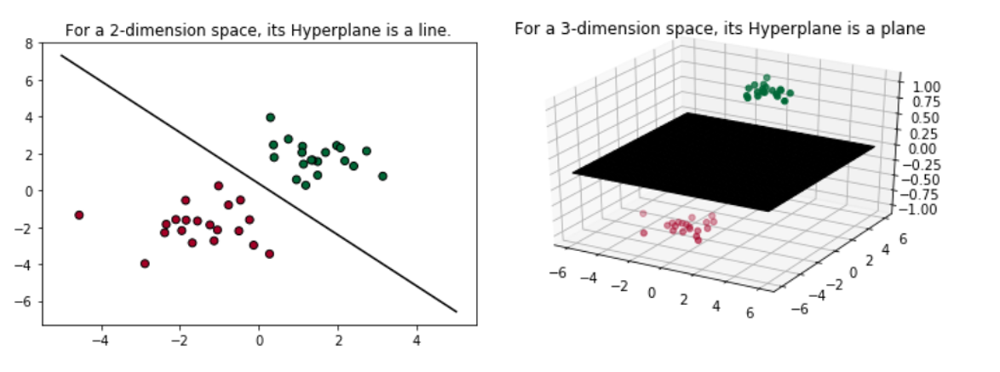
___
<center> <b>Linear Support Vector Machine Model Visualization Intuition (Chen, 2019)</b> <center>

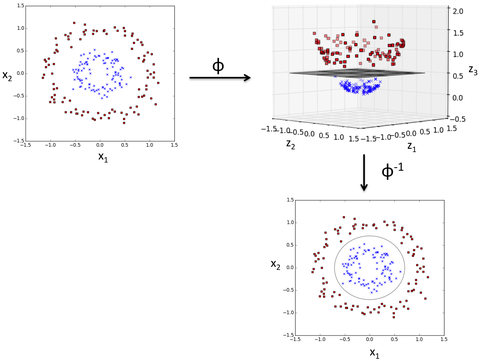
___
<center> <b>Non Linear Support Vector Machine Model with RBF Kernel (Raschka, 2016)</b> <center>

### C.1 Bivariate Support Vector Machine (Linear) Model

In [58]:
#Assign Variables used for Bivariate SVM Manually. Search for the Two Best Correlation to Landslide
upper = 0.35
lower = -0.35
var_for_SVM=[]
for i in df_corr_slide['Variable with trans_slide']:
    if df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values > upper:
        var_for_SVM.append(i)
    elif df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values < lower:
        var_for_SVM.append(i)
    else:
        continue

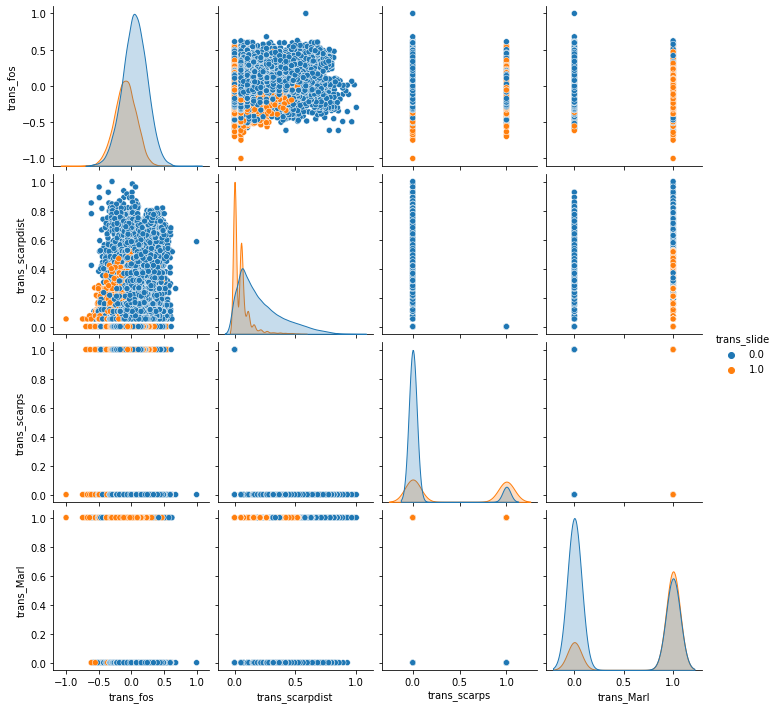

In [59]:
#Visualizing The Dataset for Bivariate SVM.
sns.pairplot(df_trans[var_for_SVM],hue='trans_slide')

In [60]:
#Dataframe for Bivariate SVM
first_var_SVM = 'trans_fos'
second_var_SVM = 'trans_scarpdist'
df_SVM = df_trans[[first_var_SVM, second_var_SVM, 'trans_slide']]
df_SVM

,trans_fos,trans_scarpdist,trans_slide
0,-0.019150,0.074023,1.0
1,-0.083948,0.052342,1.0
2,-0.105950,0.052342,1.0
3,-0.098981,0.052342,1.0
4,-0.113779,0.052342,1.0
...,...,...,...
20656,0.299248,0.493797,0.0
20657,0.280872,0.468164,0.0
20658,0.400540,0.447214,0.0
20659,0.338360,0.421998,0.0


In [61]:
#Split the Test-Training Data for Bivariate SVM
X = np.array([df_SVM[first_var_SVM],df_SVM[second_var_SVM]]).T
y = df_SVM['trans_slide'].values
rn = np.random.RandomState(0)
X_train_SVM, X_test_SVM, y_train_SVM, y_test_SVM = train_test_split(X, y, test_size=0.40, random_state=rn)

print("number of test samples for Bivariate SVM :", X_test_SVM.shape[0])
print("number of training samples for Bivariate SVM:",X_train_SVM.shape[0])

number of test samples for Bivariate SVM : 8265
number of training samples for Bivariate SVM: 12396


In [62]:
#Linear Bivariate SVM
Lin_classifier = SVC(kernel='linear')
Lin_classifier.fit(X_train_SVM, y_train_SVM)
predictions_svm_lin = Lin_classifier.predict(X_test_SVM)

In [63]:
#Confusion Matrix for linear Bivariate SVM
con_mat_pred_slide_svm_lin = confusion_matrix(y_test_SVM,predictions_svm_lin)

#Accuracy score for Linear Bivariate SVM
acc_sco_pred_slide_svm_lin = accuracy_score(y_test_SVM,predictions_svm_lin)

#Classification Report for Linear Bivariate SVM
clas_pred_slide_svm_lin = classification_report(y_test_SVM,predictions_svm_lin)

In [64]:
print(con_mat_pred_slide_svm_lin)

[[4484  994]
 [ 916 1871]]


In [65]:
print(acc_sco_pred_slide_svm_lin)

0.7689050211736237


In [66]:
print(clas_pred_slide_svm_lin)

              precision    recall  f1-score   support

         0.0       0.83      0.82      0.82      5478
         1.0       0.65      0.67      0.66      2787

    accuracy                           0.77      8265
   macro avg       0.74      0.74      0.74      8265
weighted avg       0.77      0.77      0.77      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


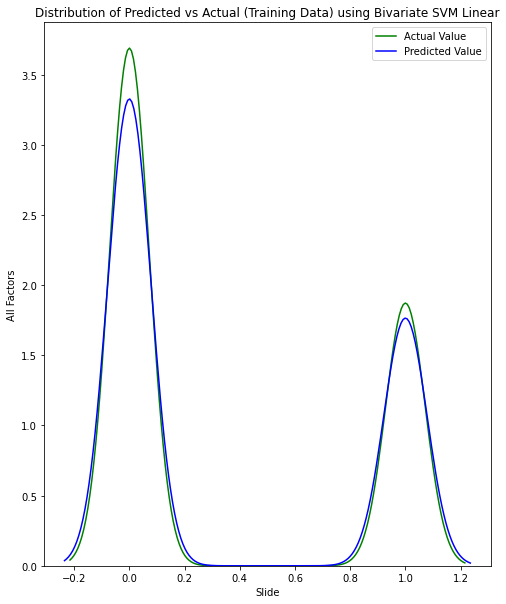

In [67]:
Title = 'Distribution of Predicted vs Actual (Training Data) using Bivariate SVM Linear'
ComparisonPlot(y_train_SVM, predictions_svm_lin, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


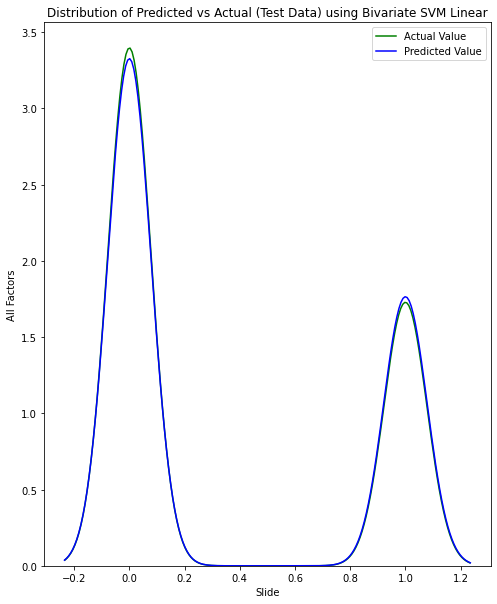

In [68]:
Title = 'Distribution of Predicted vs Actual (Test Data) using Bivariate SVM Linear'
ComparisonPlot(y_test_SVM, predictions_svm_lin, Title)

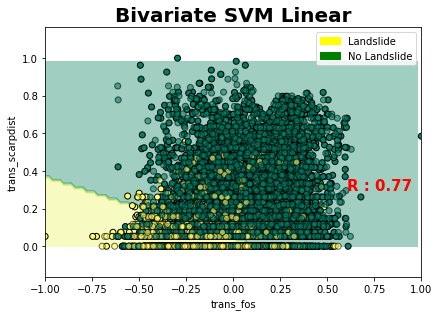

In [69]:
# code edited after Exercise of Machine Learning '03_SVM Notebook' by Authors: Florian Wellmann, Nils Chudalla (2021)

#Visualize the Result of Bivariate SVM Linear
h = 0.02

x_min, x_max = X[:, 0].min(), X[:, 0].max()
y_min, y_max = X[:, 1].min(), X[:, 1].max()
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = Lin_classifier.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Put the result into a color plot
plt.contourf(xx, yy, Z, cmap='summer', alpha=.4)
plt.scatter(X_train_SVM[:, 0], X_train_SVM[:, 1], c=y_train_SVM, cmap='summer', edgecolors='k')

# Plot the testing points
plt.scatter(X_test_SVM[:, 0], X_test_SVM[:, 1], c=y_test_SVM, cmap='summer', edgecolors='k', alpha=0.6)

#Extra
plt.text(xx.max() - .03, yy.min() + .3, ('R : %.2f' % acc_sco_pred_slide_svm_lin), color = 'r', size=15, horizontalalignment='right', fontweight = 'bold')
plt.axis('equal')
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
plt.tight_layout()
plt.xlabel(first_var_SVM)
plt.ylabel(second_var_SVM)
plt.title('Bivariate SVM Linear', size=20, fontweight = 'bold')

#Legend
yellow_patch = mpatches.Patch(color='yellow', label='Landslide')
green_patch = mpatches.Patch(color='green', label='No Landslide')
plt.legend(handles=[yellow_patch, green_patch])

### C.2 Multivariate Support Vector Machine (Linear) Model

In [70]:
#Multivariate SVM Linear
Lin_classifier_multi = SVC(kernel='linear')
Lin_classifier_multi.fit(X_train, y_train)
predictions_svm_lin_multi = Lin_classifier_multi.predict(X_test)

In [71]:
#Confusion Matrix for linear Multivariate SVM
con_mat_pred_slide_svm_lin_multi = confusion_matrix(y_test,predictions_svm_lin_multi)

#Accuracy score for Linear Multivariate SVM
acc_sco_pred_slide_svm_lin_multi = accuracy_score(y_test,predictions_svm_lin_multi)

#Classification Report for Linear Multivariate SVM
clas_pred_slide_svm_lin_multi = classification_report(y_test,predictions_svm_lin_multi)

In [72]:
print(con_mat_pred_slide_svm_lin_multi)

[[4771  707]
 [ 798 1989]]


In [73]:
print('Score for Bivariate SVM with Linear:', acc_sco_pred_slide_svm_lin_multi)

Score for Bivariate SVM with Linear: 0.8179068360556564


In [74]:
print(clas_pred_slide_svm_lin_multi)

              precision    recall  f1-score   support

         0.0       0.86      0.87      0.86      5478
         1.0       0.74      0.71      0.73      2787

    accuracy                           0.82      8265
   macro avg       0.80      0.79      0.79      8265
weighted avg       0.82      0.82      0.82      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


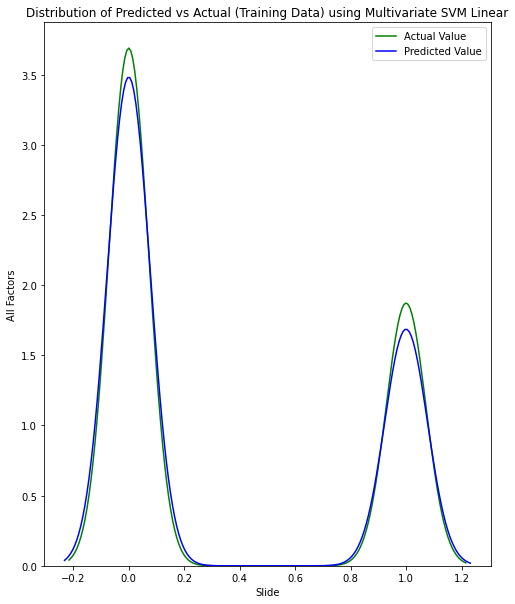

In [75]:
Title = 'Distribution of Predicted vs Actual (Training Data) using Multivariate SVM Linear'
ComparisonPlot(y_train, predictions_svm_lin_multi, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


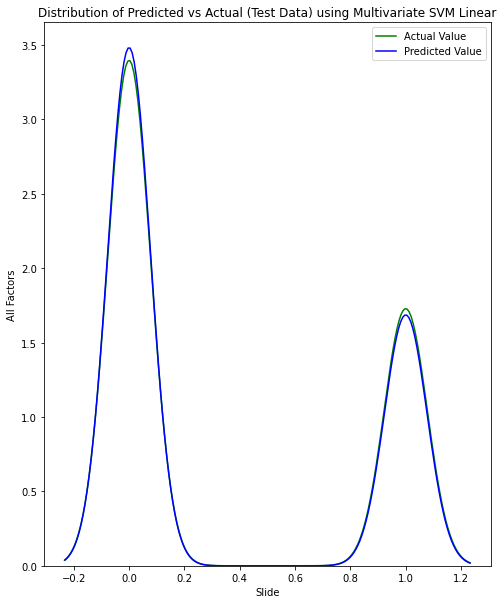

In [76]:
Title = 'Distribution of Predicted vs Actual (Test Data) using Multivariate SVM Linear'
ComparisonPlot(y_test, predictions_svm_lin_multi, Title)

### C.3 Bivariate Support Vector Machine with Radial Basis Function (RBF) Kernel Model

In [77]:
# #Parameter for Bivariate SVM RBF
# param_C_degree= [{'C': [1.0,5.0], 'degree': [2,3,4]}]
# rbf_classifier = SVC(kernel = 'rbf', gamma = 'scale')

# #Search for the Best Parameter
# Grid_svm_rbf = GridSearchCV(rbf_classifier, param_C_degree, cv=4)
# best_rbf_classifier = Grid_svm_rbf.fit(X_train_SVM,y_train_SVM).best_estimator_
# predictions_svm_rbf = best_rbf_classifier.predict(X_test_SVM)

# print('Best Parameter:', Grid_svm_rbf.best_params_)

In [78]:
#Bivariate SVM RBF after determining the Best Parameter
rbf_classifier = SVC(kernel = 'rbf', gamma = 'scale', C=5.0, degree=2)
rbf_classifier.fit(X_train_SVM,y_train_SVM)
predictions_svm_rbf = rbf_classifier.predict(X_test_SVM)

In [79]:
#Confusion Matrix for Bivariate RBF
con_mat_pred_slide_svm_rbf = confusion_matrix(y_test_SVM,predictions_svm_rbf)

#Accuracy score for Bivariate RBF
acc_sco_pred_slide_svm_rbf = accuracy_score(y_test_SVM,predictions_svm_rbf)

#Classification Report for Bivariate RBF
clas_pred_slide_svm_rbf = classification_report(y_test_SVM,predictions_svm_rbf)

In [80]:
print(con_mat_pred_slide_svm_rbf)

[[4762  716]
 [1195 1592]]


In [81]:
print('Score for Bivariate KMeans with RBF:', acc_sco_pred_slide_svm_rbf)

Score for Bivariate KMeans with RBF: 0.7687840290381125


In [82]:
print(clas_pred_slide_svm_rbf)

              precision    recall  f1-score   support

         0.0       0.80      0.87      0.83      5478
         1.0       0.69      0.57      0.62      2787

    accuracy                           0.77      8265
   macro avg       0.74      0.72      0.73      8265
weighted avg       0.76      0.77      0.76      8265



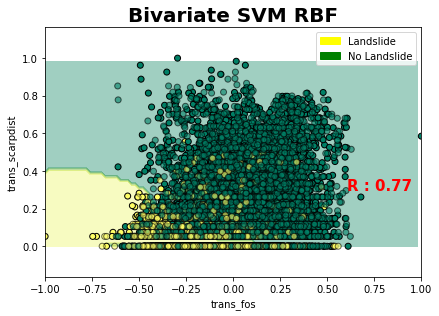

In [83]:
# code edited after Exercise of Machine Learning '03_SVM Notebook' by Authors: Florian Wellmann, Nils Chudalla (2021)

#Viisualize the Result of Bivariate SVM RBF
h = 0.02

x_min, x_max = X[:, 0].min(), X[:, 0].max()
y_min, y_max = X[:, 1].min(), X[:, 1].max()
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = rbf_classifier.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Put the result into a color plot
plt.contourf(xx, yy, Z, cmap='summer', alpha=.4)
plt.scatter(X_train_SVM[:, 0], X_train_SVM[:, 1], c=y_train_SVM, cmap='summer', edgecolors='k')

# Plot the testing points
plt.scatter(X_test_SVM[:, 0], X_test_SVM[:, 1], c=y_test_SVM, cmap='summer', edgecolors='k', alpha=0.6)

#Extra
plt.text(xx.max() - .03, yy.min() + .3, ('R : %.2f' % acc_sco_pred_slide_svm_rbf), color = 'r', size=15, horizontalalignment='right', fontweight = 'bold')
plt.axis('equal')
plt.ylim(y_min, y_max)
plt.xlim(x_min, x_max)
plt.tight_layout()
plt.xlabel(first_var_SVM)
plt.ylabel(second_var_SVM)
plt.title('Bivariate SVM RBF', size=20, fontweight = 'bold')

#Legend
yellow_patch = mpatches.Patch(color='yellow', label='Landslide')
green_patch = mpatches.Patch(color='green', label='No Landslide')
plt.legend(handles=[yellow_patch, green_patch])

### C.4 Bivariate Support Vector Machine with Polynomial Kernel Model (In-depth Mathematical Intution).

In [84]:
#Kernel Bivariate SVM RBF
df_SVM_ker = df_SVM

a = first_var_SVM + '_square'
b = second_var_SVM +'_square'

df_SVM_ker[a]= df_SVM_ker[first_var_SVM]**2
df_SVM_ker[b]= df_SVM_ker[second_var_SVM]**2

# for i in range(len(df_SVM_ker)):
#     if df_SVM_ker[first_var_SVM][i] > 0:
#         continue
#     else:
#         df_SVM_ker[a][i]= (-1)*(df_SVM_ker[a][i])
        
# for i in range(len(df_SVM_ker)):
#     if df_SVM_ker[second_var_SVM][i] > 0:
#         continue
#     else:
#         df_SVM_ker[b][i]= (-1)*(df_SVM_ker[b][i])


df_SVM_ker['Square Kernel'] = np.exp(-1*((df_SVM_ker[first_var_SVM]**2)+(df_SVM_ker[second_var_SVM]**2)))
df_SVM_ker

<ipython-input-84-dfddecbcee6a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SVM_ker[a]= df_SVM_ker[first_var_SVM]**2
<ipython-input-84-dfddecbcee6a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_SVM_ker[b]= df_SVM_ker[second_var_SVM]**2
<ipython-input-84-dfddecbcee6a>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

,trans_fos,trans_scarpdist,trans_slide,trans_fos_square,trans_scarpdist_square,Square Kernel
0,-0.019150,0.074023,1.0,0.000367,0.005479,0.994171
1,-0.083948,0.052342,1.0,0.007047,0.002740,0.990261
2,-0.105950,0.052342,1.0,0.011225,0.002740,0.986132
3,-0.098981,0.052342,1.0,0.009797,0.002740,0.987541
4,-0.113779,0.052342,1.0,0.012946,0.002740,0.984437
...,...,...,...,...,...,...
20656,0.299248,0.493797,0.0,0.089549,0.243836,0.716494
20657,0.280872,0.468164,0.0,0.078889,0.219178,0.742252
20658,0.400540,0.447214,0.0,0.160432,0.200000,0.697375
20659,0.338360,0.421998,0.0,0.114488,0.178082,0.746343


In [85]:
!pip install plotly
import plotly.express as pl

fig = pl.scatter_3d(df_SVM_ker, x=first_var_SVM, y=second_var_SVM, z='Square Kernel', color='trans_slide',title='Polynomial Kernel is Not Success')
fig.show()

### C.5 Multivariate Support Vector Machine with Radial Basis Function Model

In [86]:
#Multivariate SVM RBF
rbf_classifier_multi = SVC(kernel='rbf', gamma='scale', C= 5, degree= 2)
rbf_classifier_multi.fit(X_train, y_train)
predictions_svm_rbf_multi = rbf_classifier_multi.predict(X_test)

In [87]:
#Confusion Matrix for Multivariate RBF
con_mat_pred_slide_svm_rbf_multi = confusion_matrix(y_test,predictions_svm_rbf_multi)

#Accuracy score for Multivariate RBF
acc_sco_pred_slide_svm_rbf_multi = accuracy_score(y_test,predictions_svm_rbf_multi)

#Classification Report for Multivariate RBF
clas_pred_slide_svm_rbf_multi = classification_report(y_test,predictions_svm_rbf_multi)

In [88]:
con_mat_pred_slide_svm_rbf_multi

array([[4751,  727],
       [ 615, 2172]], dtype=int64)

In [89]:
print('Score for Multivariate SVM Multivatiate with RBF:',acc_sco_pred_slide_svm_rbf_multi)

Score for Multivariate SVM Multivatiate with RBF: 0.8376285541439806


In [90]:
print(clas_pred_slide_svm_rbf_multi)

              precision    recall  f1-score   support

         0.0       0.89      0.87      0.88      5478
         1.0       0.75      0.78      0.76      2787

    accuracy                           0.84      8265
   macro avg       0.82      0.82      0.82      8265
weighted avg       0.84      0.84      0.84      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



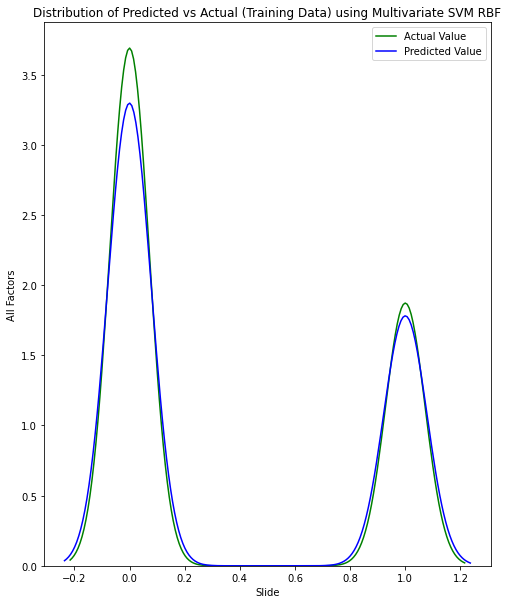

In [91]:
Title = 'Distribution of Predicted vs Actual (Training Data) using Multivariate SVM RBF'
ComparisonPlot(y_train, predictions_svm_rbf_multi, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



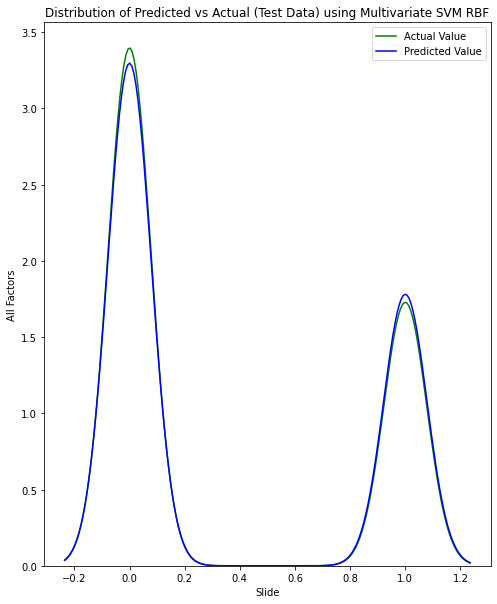

In [92]:
Title = 'Distribution of Predicted vs Actual (Test Data) using Multivariate SVM RBF'
ComparisonPlot(y_test, predictions_svm_rbf_multi, Title)

## K-MEANS Model
**K-means clustering** is an unsupervised model technique that reduces the data dimension by finding appropriate representatives or **Centroids** (center of each subset) for clusters or groups of data points (Subasi, 2020). In simple, the K-Means algorithm starts with the number of Centroids (or clusters) decision and deploys the first time Centroids location randomly. Then two iterative steps conducted until **threshold inertia** being reached, or being defined by the **maximum iteration**:
<ol>
    <li>Select the cluster for each sample in the sense of nearest position with centroid (in <b>Eucledian distance</b>).</li>
    <li>Reposition centroid by averaging over all related samples.</li>
</ol>
In the end, the best result for K-Mean Models could be achieved when it reaches the overall lowest inertia.

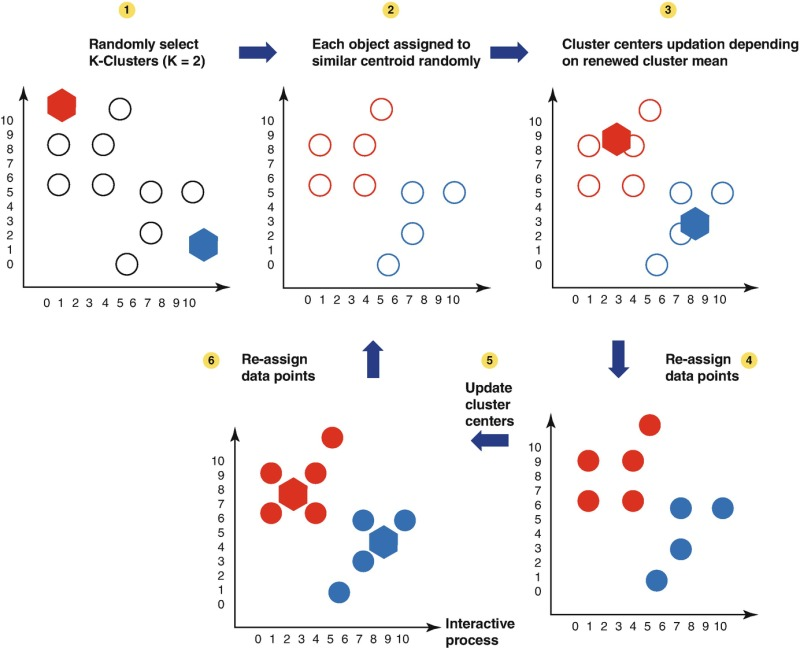
___
<center> <b>Sketch of the k-means clustering algorithm (Traverso et al., 2018)</b> <center>

### A. Bivariate K-Means Model

In [93]:
#Assign Variables used for Bivariate K-Means
upper = 0.35
lower = -0.35
var_for_kmeans=[]
for i in df_corr_slide['Variable with trans_slide']:
    if df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values > upper:
        var_for_kmeans.append(i)
    elif df_corr_slide.loc[df_corr_slide["Variable with trans_slide"] == i, ("Pearson Value")].values < lower:
        var_for_kmeans.append(i)
    else:
        continue

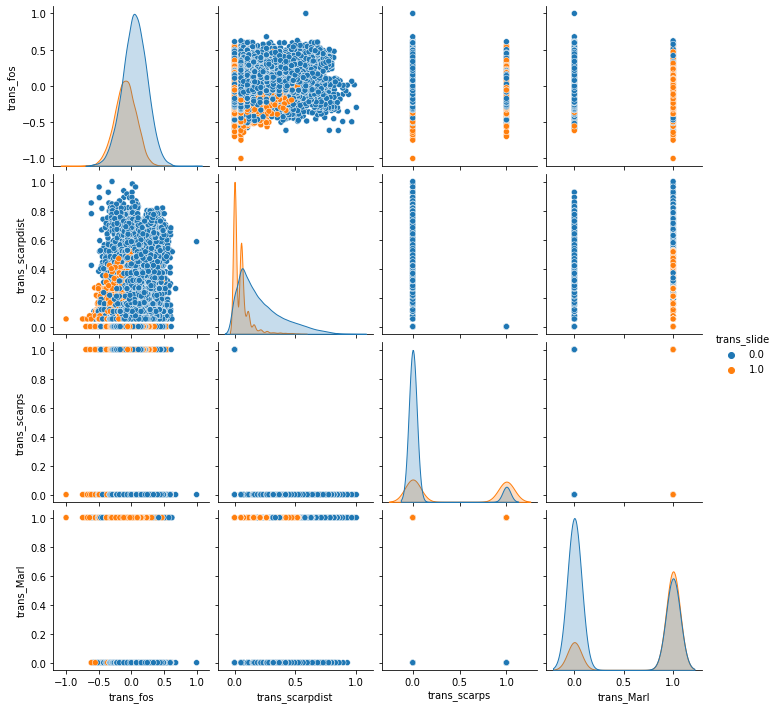

In [94]:
#Visualizing The Dataset for Bivariate K-Means
sns.pairplot(df_trans[var_for_kmeans],hue='trans_slide')

In [95]:
#Dataframe for Bivariate K-Means
first_var_kmeans = 'trans_fos'
second_var_kmeans = 'trans_scarpdist'
df_kmeans = df_trans[[first_var_kmeans, second_var_kmeans, 'trans_slide']]
df_kmeans

,trans_fos,trans_scarpdist,trans_slide
0,-0.019150,0.074023,1.0
1,-0.083948,0.052342,1.0
2,-0.105950,0.052342,1.0
3,-0.098981,0.052342,1.0
4,-0.113779,0.052342,1.0
...,...,...,...
20656,0.299248,0.493797,0.0
20657,0.280872,0.468164,0.0
20658,0.400540,0.447214,0.0
20659,0.338360,0.421998,0.0


In [96]:
#Bivariate K-means Prediction
clusterer = KMeans(n_clusters=2,random_state=7, n_init=10)
clusterer.fit(df_kmeans[[first_var_kmeans,second_var_kmeans]])
predictions_kmeans = clusterer.predict(df_kmeans[[first_var_kmeans,second_var_kmeans]])

df_kmeans['K-mean predicted'] = predictions_kmeans
df_kmeans

<ipython-input-96-ed9e6caea792>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,trans_fos,trans_scarpdist,trans_slide,K-mean predicted
0,-0.019150,0.074023,1.0,1
1,-0.083948,0.052342,1.0,1
2,-0.105950,0.052342,1.0,1
3,-0.098981,0.052342,1.0,1
4,-0.113779,0.052342,1.0,1
...,...,...,...,...
20656,0.299248,0.493797,0.0,0
20657,0.280872,0.468164,0.0,0
20658,0.400540,0.447214,0.0,0
20659,0.338360,0.421998,0.0,0


In [97]:
#Position of Centroids
print('Position of Centroids','\n', clusterer.cluster_centers_)

Position of Centroids 
 [[ 0.15272263  0.25934931]
 [-0.12466103  0.06773964]]


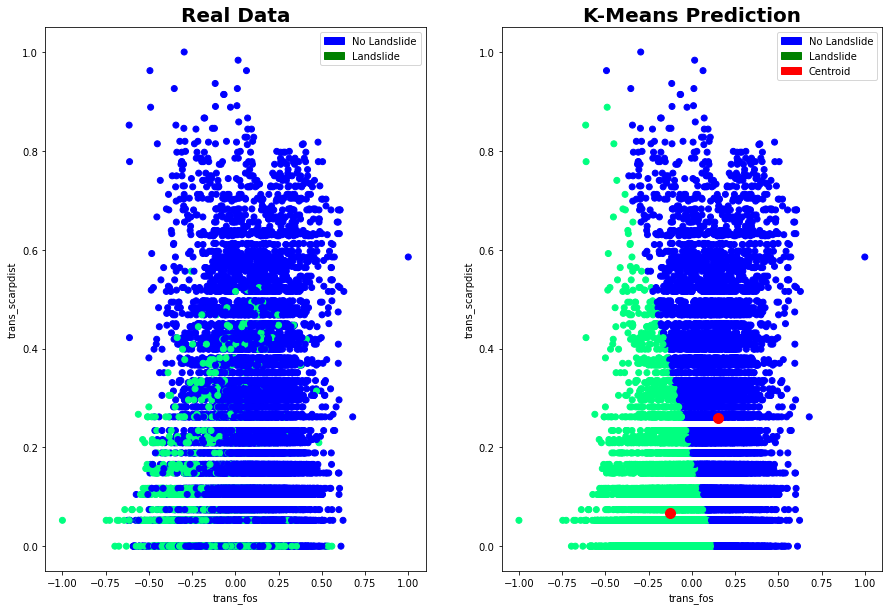

In [98]:
#Visualize the Result of Bivariate K-Means 
fig, axs = plt.subplots(1, 2, figsize=(15,10)) 

# plotting different things on different axes
axs[0].scatter(df_kmeans[first_var_kmeans], df_kmeans[second_var_kmeans], c=df_kmeans['trans_slide'], cmap='winter' )
axs[0].set_xlabel(first_var_kmeans)
axs[0].set_ylabel(second_var_kmeans)
axs[0].set_title("Real Data", size=20, fontweight = 'bold')

axs[1].scatter(df_kmeans[first_var_kmeans], df_kmeans[second_var_kmeans], c=df_kmeans['K-mean predicted'], cmap='winter')
axs[1].scatter(clusterer.cluster_centers_[:,0], clusterer.cluster_centers_[:,1], color='red', marker='o',s=100)
axs[1].set_xlabel(first_var_kmeans)
axs[1].set_ylabel(second_var_kmeans)
axs[1].set_title("K-Means Prediction", size=20, fontweight = 'bold')

#Legend
blue_patch = mpatches.Patch(color='blue', label='No Landslide')
green_patch = mpatches.Patch(color='green', label='Landslide')
centro = mpatches.Patch(color = 'red', label ='Centroid')
axs[0].legend(handles=[blue_patch, green_patch])
axs[1].legend(handles=[blue_patch, green_patch, centro])

In [99]:
#Confusion Matrix for Bivaraite K-means
con_mat_pred_slide_kmeans = confusion_matrix(df_kmeans['trans_slide'],df_kmeans['K-mean predicted'])

#Accuracy score for Bivaraite K-means
acc_sco_pred_slide_kmeans = accuracy_score(df_kmeans['trans_slide'],df_kmeans['K-mean predicted'])

#Classification Report for Bivaraite K-means
clas_pred_slide_kmeans = classification_report(df_kmeans['trans_slide'],df_kmeans['K-mean predicted'])

In [100]:
print(con_mat_pred_slide_kmeans)

[[8244 5457]
 [1036 5924]]


In [101]:
print('Score for Bivariate K-Means:', acc_sco_pred_slide_kmeans)

Score for Bivariate K-Means: 0.6857364115967282


In [102]:
print(clas_pred_slide_kmeans)

              precision    recall  f1-score   support

         0.0       0.89      0.60      0.72     13701
         1.0       0.52      0.85      0.65      6960

    accuracy                           0.69     20661
   macro avg       0.70      0.73      0.68     20661
weighted avg       0.76      0.69      0.69     20661



In [103]:
#Calculate Error for each iteration
error_rate = []

for i in range(1,30):
    clusterer_test = KMeans(n_clusters=2,random_state=7, n_init=i)
    clusterer_test.fit(df_kmeans[[first_var_kmeans,second_var_kmeans]])
    predictions_kmeans_test = clusterer_test.predict(df_kmeans[[first_var_kmeans,second_var_kmeans]])
    error_rate.append(np.mean(predictions_kmeans_test != df_kmeans['trans_slide']))

Text(0, 0.5, 'Error Rate')

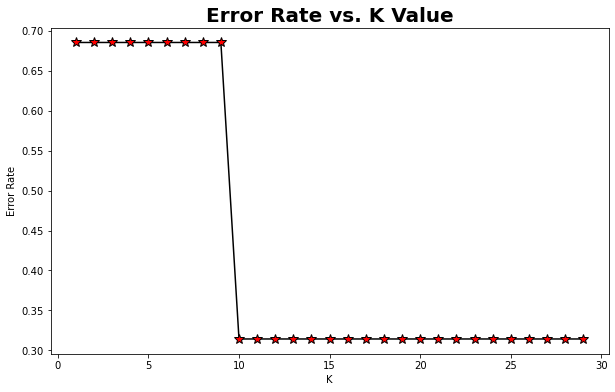

In [104]:
#Visualize The Error of K-Means Iteration
plt.figure(figsize=(10,6))
plt.plot(range(1,30),error_rate, color='black', marker='*', markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value', size=20, fontweight = 'bold')
plt.xlabel('K')
plt.ylabel('Error Rate')

### B. Multivariate K-Means Model

In [105]:
#Multivariate Kmeans Prediction
clusterer_multi = KMeans(n_clusters=2, random_state=7, n_init=50, max_iter=200)
clusterer_multi.fit(X_train, y_train)
predictions_kmeans_multi = clusterer_multi.predict(X_test)

In [106]:
#Confusion Matrix for Multivariate Kmeans
con_mat_pred_slide_kmeans_multi= confusion_matrix(y_test,predictions_kmeans_multi)

#Accuracy score for Multivariate Kmeans
acc_sco_pred_slide_kmeans_multi = accuracy_score(y_test,predictions_kmeans_multi)

#Classification Report for Multivariate Kmeans
clas_pred_slide_kmeans_multi = classification_report(y_test,predictions_kmeans_multi)

In [107]:
con_mat_pred_slide_kmeans_multi

array([[2078, 3400],
       [2196,  591]], dtype=int64)

In [108]:
print('Score for Multivariate KMeans:', acc_sco_pred_slide_kmeans_multi)

Score for Multivariate KMeans: 0.32292800967937085


In [109]:
print(clas_pred_slide_kmeans_multi)

              precision    recall  f1-score   support

         0.0       0.49      0.38      0.43      5478
         1.0       0.15      0.21      0.17      2787

    accuracy                           0.32      8265
   macro avg       0.32      0.30      0.30      8265
weighted avg       0.37      0.32      0.34      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



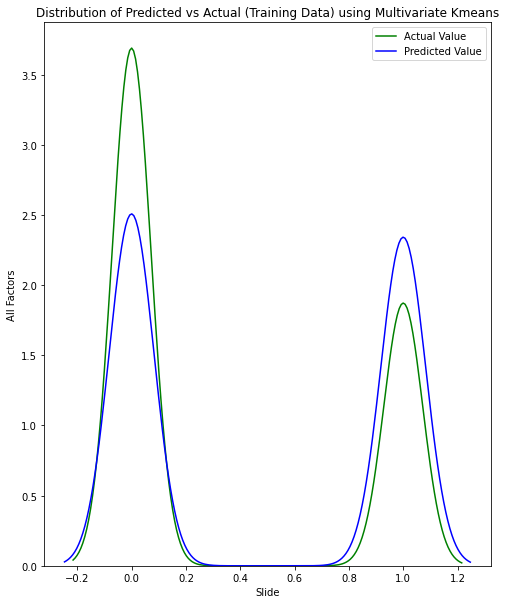

In [110]:
Title = 'Distribution of Predicted vs Actual (Training Data) using Multivariate Kmeans'
ComparisonPlot(y_train, predictions_kmeans_multi, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



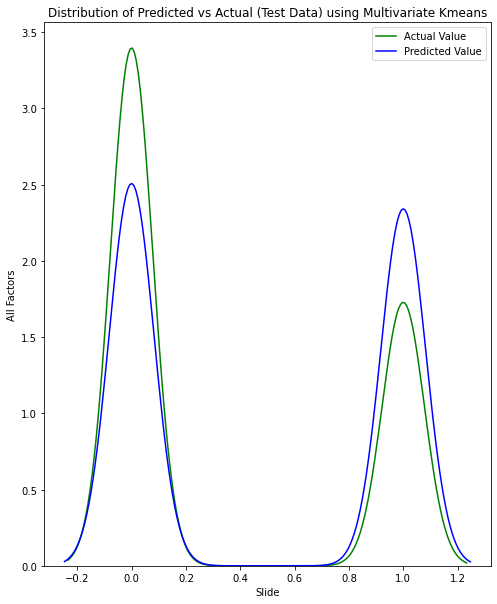

In [111]:
Title = 'Distribution of Predicted vs Actual (Test Data) using Multivariate Kmeans'
ComparisonPlot(y_test, predictions_kmeans_multi, Title)

## K-MEANS MODEL WITH PRINCIPAL COMPONENT ANALYSIS (PCA) MODEL
The inertia measurement assumes a cluster that <b>convex</b> and <b>isotropic</b>, which lead to the poorly K-Mean Clustering for elongated or irregular-shaped clusters (Chudalla and Wellmann, 2021). To overcome such a case, Principal Component Analysis could be a solution to a higher-dimensional case. 

**Principal component analysis (PCA)** is a multivariate **data dimensionality reduction technique**, used to simplify a data set to a smaller number of factors that explain most of the variability (variance) (Niculescu and Andrei, 2016). In the end, the result of PCA could be implemented in the hope of enhancing the accuracy of the model for any Machine Learning Methods. However, this enhancement still depends on the dataset itself, which sometimes also gives us no enhancement or even worsens the result.

### Multivariate K-Means with PCA Model

In [112]:
#PCA (Principal Component Analysis) to Fine-Tune Multivariate K-means
pca = PCA(n_components=2)
pca.fit(df_trans[clean_var_for_multi])
x_pca = pca.transform(df_trans[clean_var_for_multi])
print('Dimension Before PCA:',df_trans[clean_var_for_multi].shape,'\n''Dimension After PCA:',x_pca.shape)

Dimension Before PCA: (20661, 8) 
Dimension After PCA: (20661, 2)


In [113]:
#Creating Dataframe for PCA result
siap = {'Variable 1':x_pca[:,0],'Variable 2':x_pca[:,1],'Landslide Real Data':df_trans['trans_slide']}
df_kmeans_pca = pd.DataFrame(data=siap, columns=['Variable 1','Variable 2','Landslide Real Data'])
df_kmeans_pca

,Variable 1,Variable 2,Landslide Real Data
0,0.590706,-0.373168,1.0
1,0.579595,-0.370821,1.0
2,0.573261,-0.370565,1.0
3,0.574672,-0.370516,1.0
4,0.573005,-0.370910,1.0
...,...,...,...
20656,0.714803,-0.320964,0.0
20657,0.707400,-0.316457,0.0
20658,0.721645,-0.310306,0.0
20659,0.710190,-0.307221,0.0


In [114]:
#Split the Data for Kmeans after PCA
rn = np.random.RandomState(0)
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(df_kmeans_pca[['Variable 1', 'Variable 2']], df_kmeans_pca['Landslide Real Data'], test_size=0.20, random_state=rn)

In [115]:
#Bivariate Kmeans Prediction after PCA
clusterer_multi_pca = KMeans(n_clusters=2, random_state=7, n_init=50, max_iter=200)
clusterer_multi_pca.fit(X_train_pca, y_train_pca)
predictions_kmeans_pca = clusterer_multi_pca.predict(X_test_pca)

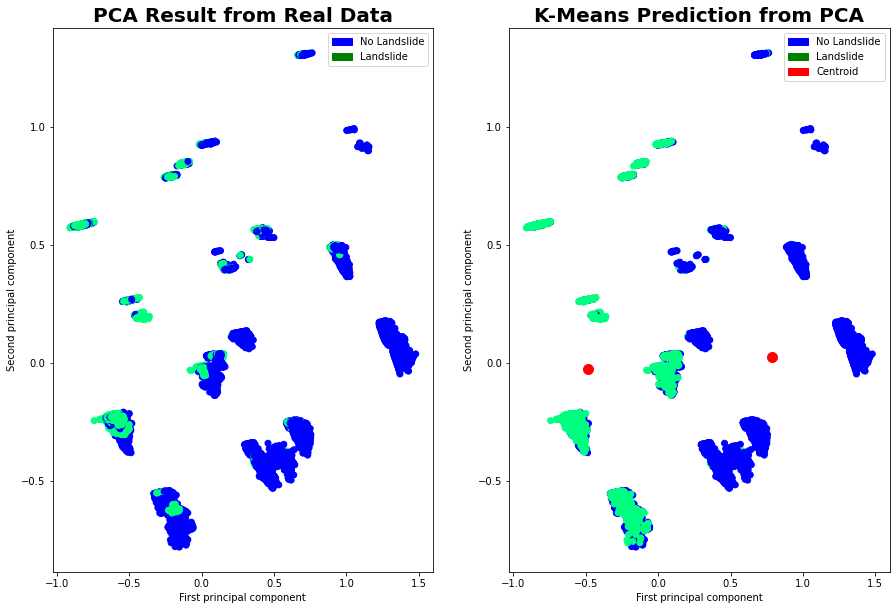

In [116]:
#Visualize the Result
fig, axs = plt.subplots(1, 2, figsize=(15,10)) 

# plotting different things on different axes
axs[0].scatter(df_kmeans_pca['Variable 1'],df_kmeans_pca['Variable 2'],c=df_kmeans_pca['Landslide Real Data'],cmap='winter')
axs[0].set_xlabel('First principal component')
axs[0].set_ylabel('Second principal component')
axs[0].set_title("PCA Result from Real Data", size=20, fontweight = 'bold')

axs[1].scatter(X_train_pca['Variable 1'],X_train_pca['Variable 2'],c=y_train_pca,cmap='winter')
axs[1].scatter(X_test_pca['Variable 1'],X_test_pca['Variable 2'],c=predictions_kmeans_pca,cmap='winter')
axs[1].scatter(clusterer_multi_pca.cluster_centers_[:,0], clusterer_multi_pca.cluster_centers_[:,1], color='red', marker='o',s=100)
axs[1].set_xlabel('First principal component')
axs[1].set_ylabel('Second principal component')
axs[1].set_title("K-Means Prediction from PCA", size=20, fontweight = 'bold')

#Legend
blue_patch = mpatches.Patch(color='blue', label='No Landslide')
green_patch = mpatches.Patch(color='green', label='Landslide')
centro = mpatches.Patch(color = 'red', label ='Centroid')
axs[0].legend(handles=[blue_patch, green_patch])
axs[1].legend(handles=[blue_patch, green_patch, centro])

In [117]:
#Confusion Matrix for Multivariate Kmeans with PCA
con_mat_pred_slide_kmeans_multi_pca= confusion_matrix(y_test_pca,predictions_kmeans_pca)

#Accuracy score for Multivariate Kmeans with PCA
acc_sco_pred_slide_kmeans_multi_pca = accuracy_score(y_test_pca,predictions_kmeans_pca)

#Classification Report for Multivariate Kmeans with PCA
clas_pred_slide_kmeans_multi_pca = classification_report(y_test_pca,predictions_kmeans_pca)

In [118]:
con_mat_pred_slide_kmeans_multi_pca

array([[1400, 1324],
       [ 164, 1245]], dtype=int64)

In [119]:
print('Score for Multivariate KMeans after PCA:', acc_sco_pred_slide_kmeans_multi_pca)
print('VS')
print('Score for Multivariate KMeans:', acc_sco_pred_slide_kmeans_multi)

Score for Multivariate KMeans after PCA: 0.6399709654004355
VS
Score for Multivariate KMeans: 0.32292800967937085


In [120]:
print(clas_pred_slide_kmeans_multi_pca)

              precision    recall  f1-score   support

         0.0       0.90      0.51      0.65      2724
         1.0       0.48      0.88      0.63      1409

    accuracy                           0.64      4133
   macro avg       0.69      0.70      0.64      4133
weighted avg       0.76      0.64      0.64      4133



## Artificial Neural Network (ANN) Model
**Artificial neural networks (ANN)** using the **principles of biological neural network function** to estimate the correlation between a set of input and output parameters which can be used both in classification, categories, and regression problems, where the correlation between input and output is required (Karkalos and Markopoulos, 2017). This Unsupervised Method has one type called **Perceptron** with the outputs are 0 and 1. It is determined by the weighted summation of the data inputs that have less or greater value than the threshold value. 

In most cases of ANN, the basic method that we will use is the **The Multilayer Perceptron**, which has neurons (perceptrons) in the hidden layers for the deployment of weights and functions. The variation in weights and the threshold will get different models for decision-making.

However, the ANNs generally suffer from **overfitting problems** because a reasonably sized ANN has far more parameters to be estimated than there are transfer samples available (Brown, 2009). That is why we should not use robust parameters, especially for the Model of Prediction.

### A. Multi Layered Perceptron (MLP) Model

In [121]:
# #Parameter for Bivariate SVM RBF
# param_activation= [{'hidden_layer_sizes': [(50,),(100,),(200,),(300,)],'activation': ['identity', 'logistic', 'tanh', 'relu']}]
# MLP = MLPClassifier(alpha = 0.01, max_iter = 500)

# #Search for the Best Parameter
# Grid_MLP = GridSearchCV(MLP, param_activation, cv=4)
# best_MLP = Grid_MLP.fit(X_train,y_train).best_estimator_
# predictions_MLP = best_MLP.predict(X_test)

# print('Best Parameter:', Grid_MLP.best_params_)

In [122]:
#MLP Prediction after determining the Best Parameter
MLP = MLPClassifier(hidden_layer_sizes=(100,), alpha = 0.01, activation = 'relu', max_iter = 500)
MLP.fit(X_train, y_train)
predictions_MLP = MLP.predict(X_test)

In [123]:
#Confusion Matrix for MLP
con_mat_pred_slide_MLP= confusion_matrix(y_test,predictions_MLP)

#Accuracy score for MLP
acc_sco_pred_slide_MLP = accuracy_score(y_test,predictions_MLP)

#Classification Report for MLP
clas_pred_slide_MLP = classification_report(y_test,predictions_MLP)

In [124]:
print(con_mat_pred_slide_MLP)

[[4773  705]
 [ 611 2176]]


In [125]:
print('Score for MLP:', acc_sco_pred_slide_MLP)

Score for MLP: 0.8407743496672716


In [126]:
print(clas_pred_slide_MLP)

              precision    recall  f1-score   support

         0.0       0.89      0.87      0.88      5478
         1.0       0.76      0.78      0.77      2787

    accuracy                           0.84      8265
   macro avg       0.82      0.83      0.82      8265
weighted avg       0.84      0.84      0.84      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



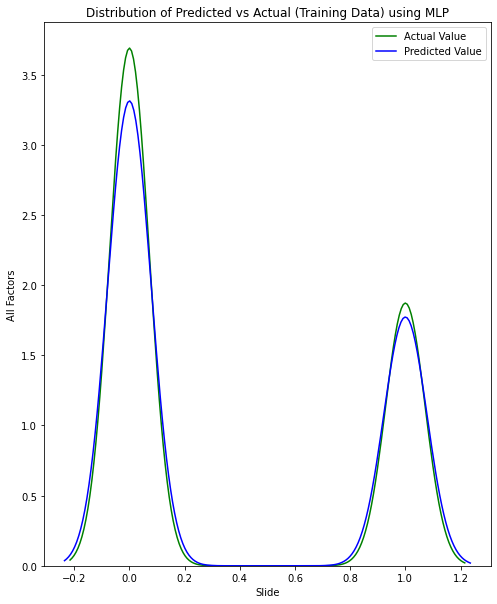

In [127]:
Title = 'Distribution of Predicted vs Actual (Training Data) using MLP'
ComparisonPlot(y_train, predictions_MLP, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



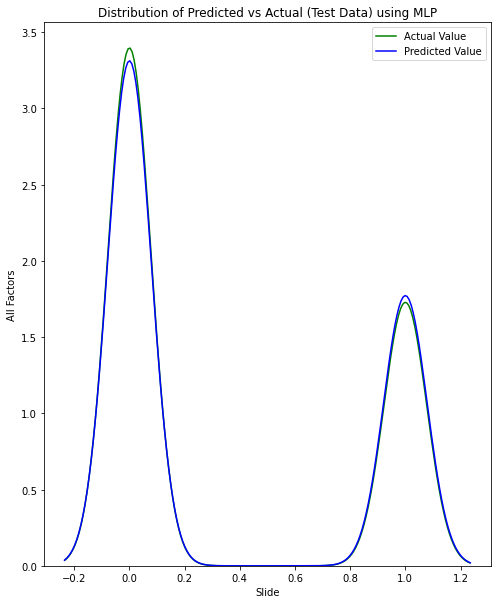

In [128]:
Title = 'Distribution of Predicted vs Actual (Test Data) using MLP'
ComparisonPlot(y_test, predictions_MLP, Title)

### B. Multi Layered Perceptron (MLP) with Principal Component Analysis (PCA) Model

In [129]:
#PCA (Principal Component Analysis) to fine tune MLP
pca_mlp = PCA(n_components=1)
pca_mlp.fit(df_trans[clean_var_for_multi])
x_pca_mlp = pca_mlp.transform(df_trans[clean_var_for_multi])
print('Dimension Before PCA:',df_trans[clean_var_for_multi].shape,'\n''Dimension After PCA:',x_pca_mlp.shape)

Dimension Before PCA: (20661, 8) 
Dimension After PCA: (20661, 1)


In [130]:
#Creating Dataframe for PCA result
siap_mlp = {'Variable 1':x_pca_mlp[:,0],'Landslide Real Data':df_trans['trans_slide']}
df_mlp_pca = pd.DataFrame(data=siap_mlp, columns=['Variable 1','Landslide Real Data'])
df_mlp_pca

,Variable 1,Landslide Real Data
0,0.590706,1.0
1,0.579595,1.0
2,0.573261,1.0
3,0.574672,1.0
4,0.573005,1.0
...,...,...
20656,0.714803,0.0
20657,0.707400,0.0
20658,0.721645,0.0
20659,0.710190,0.0


In [131]:
#Split the Data for Kmeans after PCA
rn = np.random.RandomState(0)
X_train_pca_mlp, X_test_pca_mlp, y_train_pca_mlp, y_test_pca_mlp = train_test_split(df_mlp_pca['Variable 1'], df_mlp_pca['Landslide Real Data'], test_size=0.40, random_state=rn)

In [132]:
#MLP Prediction after PCA
MLP_pca = MLPClassifier(hidden_layer_sizes=(100,), alpha = 0.01, activation = 'relu', max_iter = 500)
MLP_pca.fit(X_train_pca_mlp.values.reshape(-1, 1), y_train_pca_mlp.values.reshape(-1, 1))
predictions_MLP_pca = MLP_pca.predict(X_test_pca_mlp.values.reshape(-1, 1))

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



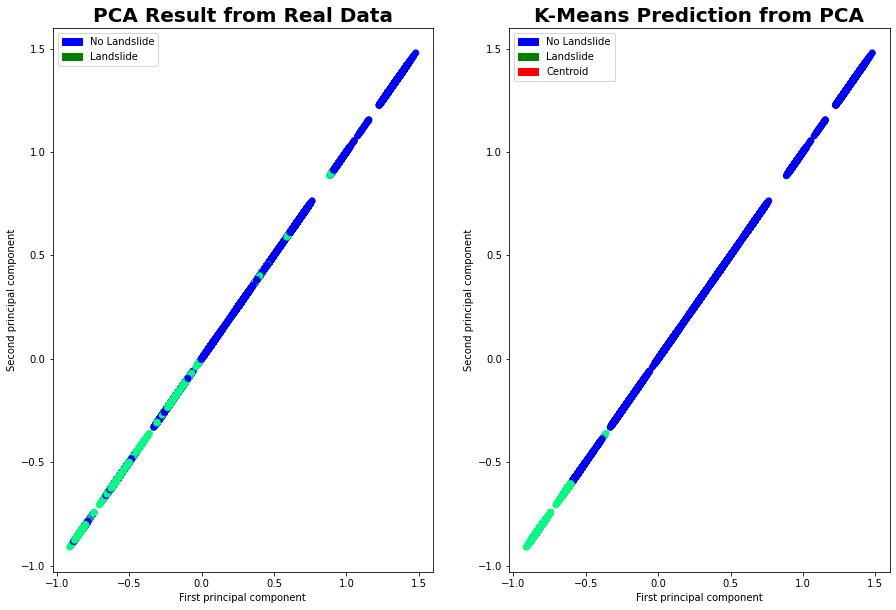

In [133]:
#Visualize the Result
fig, axs = plt.subplots(1, 2, figsize=(15,10)) 

# plotting different things on different axes
axs[0].scatter(df_mlp_pca['Variable 1'], df_mlp_pca['Variable 1'],c=df_mlp_pca['Landslide Real Data'],cmap='winter')
axs[0].set_xlabel('First principal component')
axs[0].set_ylabel('Second principal component')
axs[0].set_title("PCA Result from Real Data", size=20, fontweight = 'bold')

axs[1].scatter(X_train_pca_mlp, X_train_pca_mlp,c=y_train_pca_mlp,cmap='winter')
axs[1].scatter(X_test_pca_mlp, X_test_pca_mlp,c=predictions_MLP_pca,cmap='winter')
axs[1].set_xlabel('First principal component')
axs[1].set_ylabel('Second principal component')
axs[1].set_title("K-Means Prediction from PCA", size=20, fontweight = 'bold')

#Legend
blue_patch = mpatches.Patch(color='blue', label='No Landslide')
green_patch = mpatches.Patch(color='green', label='Landslide')
centro = mpatches.Patch(color = 'red', label ='Centroid')
axs[0].legend(handles=[blue_patch, green_patch])
axs[1].legend(handles=[blue_patch, green_patch, centro])

In [134]:
#Confusion Matrix for MLP after PCA
con_mat_pred_slide_MLP_pca= confusion_matrix(y_test_pca_mlp,predictions_MLP_pca)

#Accuracy score for MLP after PCA
acc_sco_pred_slide_MLP_pca= accuracy_score(y_test_pca_mlp,predictions_MLP_pca)

#Classification Report for MLP after PCA
clas_pred_slide_MLP_pca = classification_report(y_test_pca_mlp,predictions_MLP_pca)

In [135]:
con_mat_pred_slide_MLP_pca

array([[4839,  639],
       [1112, 1675]], dtype=int64)

In [136]:
print('Score for MLP after PCA:', acc_sco_pred_slide_MLP_pca)

Score for MLP after PCA: 0.7881427707199032


In [137]:
print(clas_pred_slide_MLP_pca)

              precision    recall  f1-score   support

         0.0       0.81      0.88      0.85      5478
         1.0       0.72      0.60      0.66      2787

    accuracy                           0.79      8265
   macro avg       0.77      0.74      0.75      8265
weighted avg       0.78      0.79      0.78      8265



C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



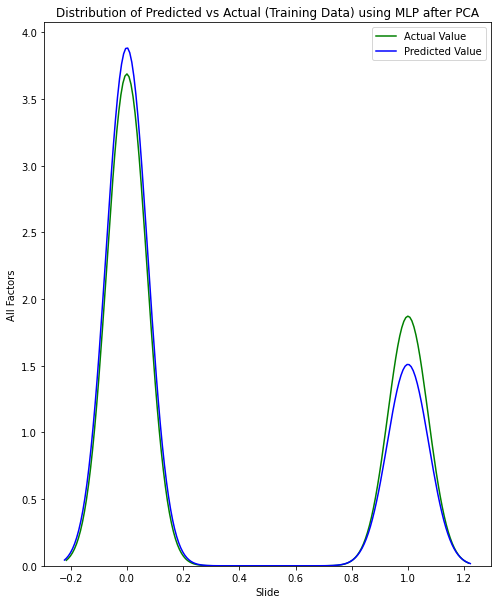

In [138]:
Title = 'Distribution of Predicted vs Actual (Training Data) using MLP after PCA'
ComparisonPlot(y_train_pca_mlp, predictions_MLP_pca, Title)

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

C:\Users\Ryan Bobby A\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



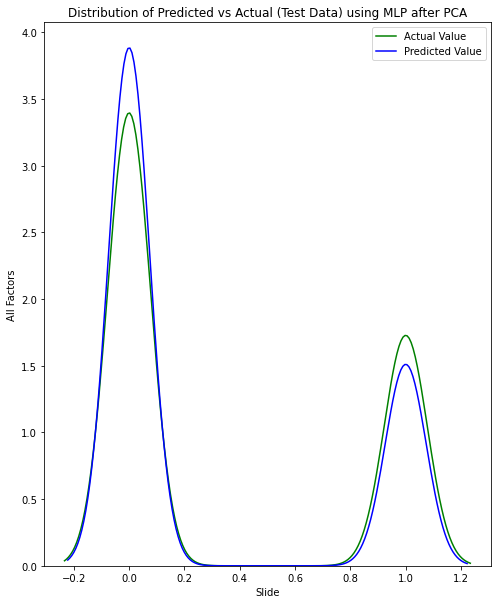

In [139]:
Title = 'Distribution of Predicted vs Actual (Test Data) using MLP after PCA'
ComparisonPlot(y_test_pca_mlp, predictions_MLP_pca, Title)

# THE COMPARISON FOR ALL ACCURACY SCORE PREDICTIONS

In [140]:
#Dataframe for all model Score Evaluation
model = ['Logistic Regression','Decision Tree','Bivariate SVM Linear','Multivariate SVM Linear','Bivariate SVM RBF','Bivariate SVM Polynomial','Multivariate SVM RBF','Bivariate K-Means','Multivariate K-Means','Multivariate K-Means with PCA','Multi Layered Perceptron (MLP)','MLP with PCA']
evaluation = ['Accuracy Score']

eval_df = pd.DataFrame(index = model, columns = evaluation)

#Logistic Regression
eval_df.loc['Logistic Regression'] = acc_sco_pred_slide

#Decision Tree
eval_df.loc['Decision Tree'] = acc_sco_pred_slide_tree

#Bivariate SVM Linear
eval_df.loc['Bivariate SVM Linear'] = acc_sco_pred_slide_svm_lin

#Multivariate SVM Linear
eval_df.loc['Multivariate SVM Linear'] = acc_sco_pred_slide_svm_lin_multi

#Bivariate SVM RBF
eval_df.loc['Bivariate SVM RBF'] = acc_sco_pred_slide_svm_rbf

#Bivariate SVM RBF with Kernel
eval_df.loc['Bivariate SVM Polynomial'] = np.nan

#Multivariate SVM RBF
eval_df.loc['Multivariate SVM RBF'] = acc_sco_pred_slide_svm_rbf_multi

#Bivariate K-Means
eval_df.loc['Bivariate K-Means'] = acc_sco_pred_slide_kmeans

#Multivariate K-Means
eval_df.loc['Multivariate K-Means'] = acc_sco_pred_slide_kmeans_multi

#Multivariate K-Means with PCA
eval_df.loc['Multivariate K-Means with PCA'] = acc_sco_pred_slide_kmeans_multi_pca

#MLP
eval_df.loc['Multi Layered Perceptron (MLP)'] = acc_sco_pred_slide_MLP

#MLP with PCA
eval_df.loc['MLP with PCA'] = acc_sco_pred_slide_MLP_pca

eval_df.sort_values(by='Accuracy Score' ,ascending=False)

,Accuracy Score
Multi Layered Perceptron (MLP),0.840774
Multivariate SVM RBF,0.837629
Decision Tree,0.831821
Multivariate SVM Linear,0.817907
Logistic Regression,0.815971
MLP with PCA,0.788143
Bivariate SVM Linear,0.768905
Bivariate SVM RBF,0.768784
Bivariate K-Means,0.685736
Multivariate K-Means with PCA,0.639971
